<a href="https://colab.research.google.com/github/matteo9910/StressDetectionBasedOnWearableSensorData/blob/main/WESAD_EMPATICA_PREPROCESSING_CROSS_TEST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, iirnotch
import seaborn as sns
import scipy.stats as stats
import numpy as np
from scipy.stats import shapiro
import math
from scipy.stats import mannwhitneyu
from scipy.signal import welch
import ipywidgets as widgets
from IPython.display import display
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.signal import resample

In [ ]:
zip_path = "/content/drive/My Drive/WESAD/WESAD.zip"
extract_dir = "/content/WESAD_data"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("Estrazione completata.")

Estrazione completata.


In [ ]:
pkl_files = []
for root, dirs, files in os.walk(extract_dir):
    for file in files:
        if file.endswith(".pkl"):
            pkl_files.append(os.path.join(root, file))

print(f"Trovati {len(pkl_files)} file .pkl")

Trovati 15 file .pkl


In [ ]:
pkl_files

['/content/WESAD_data/WESAD/S5/S5.pkl',
 '/content/WESAD_data/WESAD/S7/S7.pkl',
 '/content/WESAD_data/WESAD/S4/S4.pkl',
 '/content/WESAD_data/WESAD/S2/S2.pkl',
 '/content/WESAD_data/WESAD/S16/S16.pkl',
 '/content/WESAD_data/WESAD/S14/S14.pkl',
 '/content/WESAD_data/WESAD/S17/S17.pkl',
 '/content/WESAD_data/WESAD/S10/S10.pkl',
 '/content/WESAD_data/WESAD/S9/S9.pkl',
 '/content/WESAD_data/WESAD/S11/S11.pkl',
 '/content/WESAD_data/WESAD/S3/S3.pkl',
 '/content/WESAD_data/WESAD/S13/S13.pkl',
 '/content/WESAD_data/WESAD/S15/S15.pkl',
 '/content/WESAD_data/WESAD/S8/S8.pkl',
 '/content/WESAD_data/WESAD/S6/S6.pkl']

In [ ]:
import pickle

with open("/content/WESAD_data/WESAD/S2/S2.pkl", 'rb') as f:
    data = pickle.load(f, encoding='latin1')

# Visualizza le chiavi principali
print(data.keys())  # dovrebbe contenere: 'signal', 'label', ...

# Visualizza le chiavi interne del blocco wrist
print(data['signal'].keys())       # ['chest', 'wrist']
print(data['signal']['wrist'].keys())  # ['ACC', 'BVP', 'EDA', 'TEMP']

# Ora controlla la forma dei segnali
for key, value in data['signal']['wrist'].items():
    print(f"{key}: shape {value.shape}")

for key, value in data['signal']['chest'].items():
    print(f"{key}: shape {value.shape}")

dict_keys(['signal', 'label', 'subject'])
dict_keys(['chest', 'wrist'])
dict_keys(['ACC', 'BVP', 'EDA', 'TEMP'])
ACC: shape (194528, 3)
BVP: shape (389056, 1)
EDA: shape (24316, 1)
TEMP: shape (24316, 1)
ACC: shape (4255300, 3)
ECG: shape (4255300, 1)
EMG: shape (4255300, 1)
EDA: shape (4255300, 1)
Temp: shape (4255300, 1)
Resp: shape (4255300, 1)


In [ ]:
print(np.unique(data['label']), data['label'].shape)

[0 1 2 3 4 6 7] (4255300,)


In [ ]:
def load_all_subjects_wrist_dataframe(subject_ids, target_freq=64):
    all_data = []

    # Frequenze originali dei segnali wrist
    freq_map = {
        'ACC': 32,
        'BVP': 64,
        'EDA': 4,
        'TEMP': 4
    }
    original_label_freq = 700  # frequenza delle label

    for subject_id in subject_ids:
        file_path = f"/content/WESAD_data/WESAD/{subject_id}/{subject_id}.pkl"

        with open(file_path, 'rb') as f:
            data = pickle.load(f, encoding='latin1')

        wrist = data['signal']['wrist']
        label = data['label']

        # Resample segnali
        acc = wrist['ACC']
        bvp = wrist['BVP']
        eda = wrist['EDA']
        temp = wrist['TEMP']

        acc_resampled = resample(acc, int(len(acc) * target_freq / freq_map['ACC']))
        bvp_resampled = resample(bvp, int(len(bvp) * target_freq / freq_map['BVP'])).squeeze()
        eda_resampled = resample(eda, int(len(eda) * target_freq / freq_map['EDA'])).squeeze()
        temp_resampled = resample(temp, int(len(temp) * target_freq / freq_map['TEMP'])).squeeze()

        # Downsample delle label da 700 Hz a 64 Hz
        target_len = min(len(bvp_resampled), len(eda_resampled), len(temp_resampled), acc_resampled.shape[0])
        label_resampled = resample(label, target_len).round().astype(int)

        # Creazione del DataFrame
        df = pd.DataFrame({
            'acc1': acc_resampled[:target_len, 0],
            'acc2': acc_resampled[:target_len, 1],
            'acc3': acc_resampled[:target_len, 2],
            'bvp': bvp_resampled[:target_len],
            'eda': eda_resampled[:target_len],
            'temp': temp_resampled[:target_len],
            'label': label_resampled[:target_len],
            'subject': [subject_id] * target_len
        })

        # Filtra solo label 1 (baseline) e 2 (stress)
        df = df[df['label'].isin([1, 2])].reset_index(drop=True)

        all_data.append(df)

    return pd.concat(all_data, ignore_index=True)

In [ ]:
subject_ids = ["S2", "S3", "S4", "S5", "S6", "S7", "S8", "S9", "S10", "S11", "S13", "S14", "S15", "S16", "S17"]

df = load_all_subjects_wrist_dataframe(subject_ids)

In [ ]:
print("Shape of df:", df.shape)
df.head()

Shape of df: (1765022, 8)


,acc1,acc2,acc3,bvp,eda,temp,label,subject
0,39.632707,27.934275,29.026543,-109.34,1.637743,35.809888,1,S2
1,31.000000,27.000000,28.000000,-102.80,1.635583,35.809859,1,S2
2,27.763127,26.982961,25.535968,-96.55,1.633773,35.809835,1,S2
3,29.000000,27.000000,27.000000,-90.06,1.632363,35.809819,1,S2
4,28.729609,26.571029,33.415067,-83.19,1.631390,35.809809,1,S2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1765022 entries, 0 to 1765021
Data columns (total 8 columns):
 #   Column   Dtype  
---  ------   -----  
 0   acc1     float64
 1   acc2     float64
 2   acc3     float64
 3   bvp      float64
 4   eda      float64
 5   temp     float64
 6   label    int64  
 7   subject  object 
dtypes: float64(6), int64(1), object(1)
memory usage: 107.7+ MB


In [ ]:
df.describe()

,acc1,acc2,acc3,bvp,eda,temp,label
count,1.765022e+06,1.765022e+06,1.765022e+06,1.765022e+06,1.765022e+06,1.765022e+06,1.765022e+06
mean,1.535957e+01,-6.201214e+00,8.996315e+00,1.357649e-02,2.083079e+00,3.309247e+01,1.361389e+00
std,4.294329e+01,2.986499e+01,3.132591e+01,6.748601e+01,2.789003e+00,1.447107e+00,4.804032e-01
min,-1.424491e+02,-1.404826e+02,-1.483539e+02,-1.617860e+03,7.319605e-02,2.932185e+01,1.000000e+00
25%,-2.997185e+01,-2.700567e+01,-8.000000e+00,-1.721000e+01,3.031738e-01,3.247004e+01,1.000000e+00
50%,3.385162e+01,-8.000000e+00,1.200000e+01,2.300000e+00,9.864967e-01,3.323547e+01,1.000000e+00
75%,5.300000e+01,1.100000e+01,3.300000e+01,1.864000e+01,2.891560e+00,3.399992e+01,2.000000e+00
max,1.763469e+02,1.363099e+02,1.595612e+02,1.789000e+03,1.594567e+01,3.597752e+01,2.000000e+00


In [ ]:
df['acc_mag'] = np.sqrt(df['acc1']**2+df['acc2']**2+df['acc3']**2)
df = df.drop(columns = ['acc1', 'acc2', 'acc3'], axis = 1)

In [ ]:
df.head()

,bvp,eda,temp,label,subject,acc_mag
0,-109.34,1.637743,35.809888,1,S2,56.512082
1,-102.80,1.635583,35.809859,1,S2,49.739320
2,-96.55,1.633773,35.809835,1,S2,46.378412
3,-90.06,1.632363,35.809819,1,S2,47.947888
4,-83.19,1.631390,35.809809,1,S2,51.458495


In [ ]:
freq_assolute = df["label"].value_counts()
freq_relative = df["label"].value_counts(normalize=True)

frequency_table = pd.DataFrame({
    'Frequenza Assoluta': freq_assolute,
    'Frequenza Relativa (%)': freq_relative.round(2)*100
})

frequency_table

,Frequenza Assoluta,Frequenza Relativa (%)
label,,
1,1127162,64.0
2,637860,36.0


In [ ]:
df.isna().sum()

,0
bvp,0
eda,0
temp,0
label,0
subject,0
acc_mag,0


In [ ]:
def plot_segnali_per_soggetto(df, segnali=None, n_points=None):

    if segnali is None:
        segnali = ['acc_mag', 'bvp', 'eda', 'temp']

    soggetti = df['subject'].unique()

    for soggetto in soggetti:
        df_soggetto = df[df['subject'] == soggetto]
        print(f"\n Soggetto: {soggetto}")

        for segnale in segnali:

            baseline = df_soggetto[df_soggetto['label'] == 1][segnale].values
            stress = df_soggetto[df_soggetto['label'] == 2][segnale].values

            if n_points is not None:
                baseline = baseline[:n_points]
                stress = stress[:n_points]

            plt.figure(figsize=(15, 3))
            plt.plot(baseline, color='green', label='Baseline', linewidth=0.8)
            plt.plot(range(len(baseline), len(baseline) + len(stress)), stress, color='red', label='Stress', linewidth=0.8)
            plt.title(f"Soggetto: {soggetto} - Segnale: {segnale.upper()}", fontsize=14)
            plt.xlabel("Campioni")
            plt.ylabel("Ampiezza")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()


 Soggetto: S2


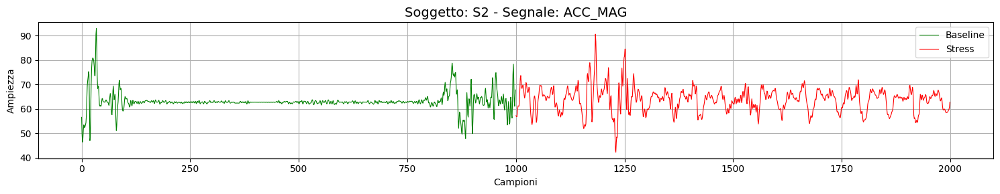

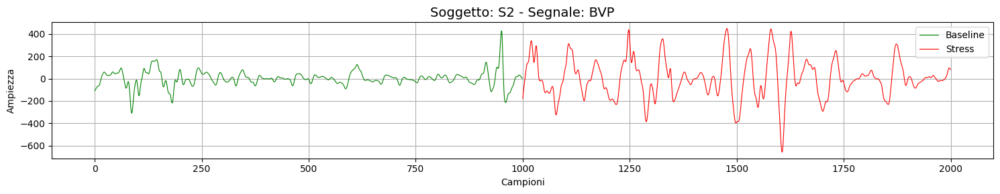

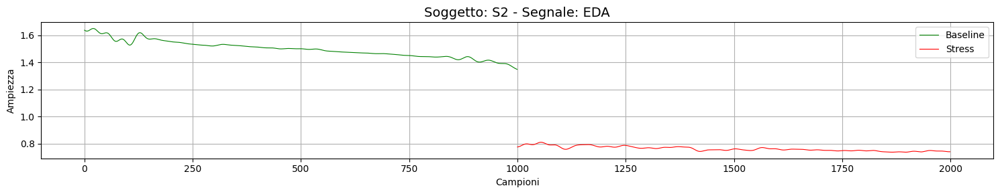

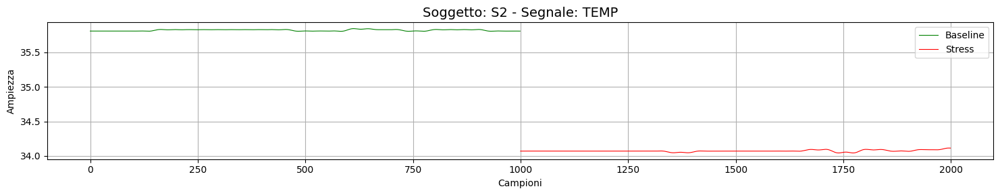


 Soggetto: S3


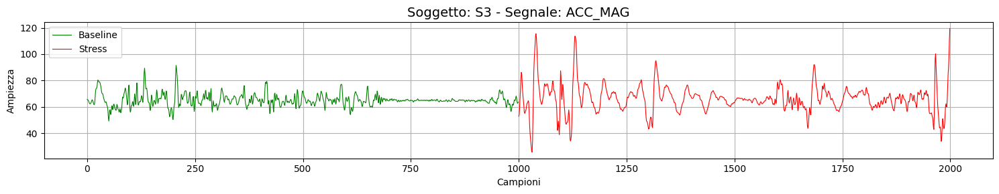

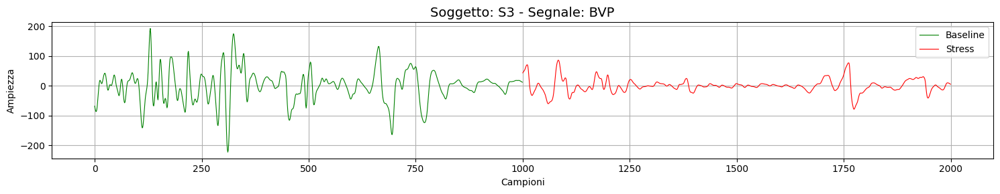

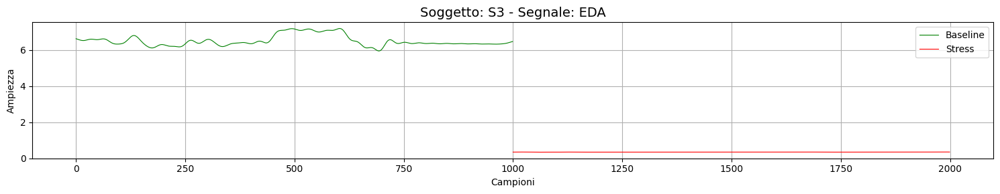

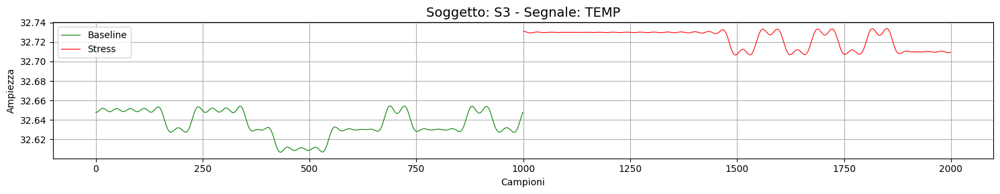


 Soggetto: S4


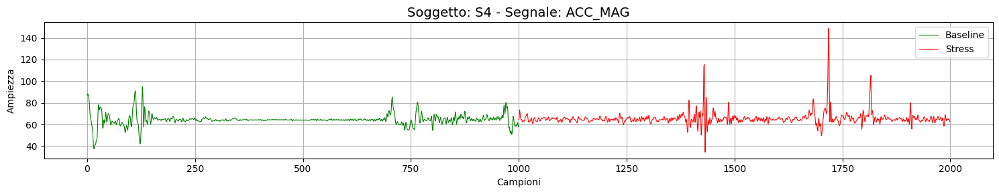

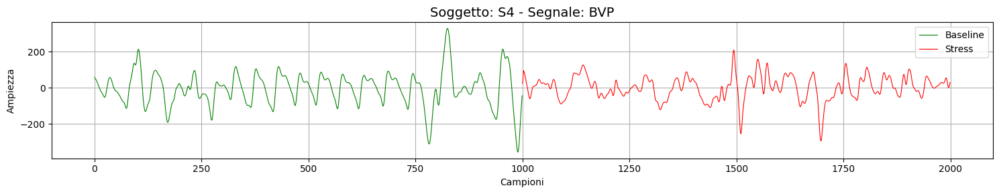

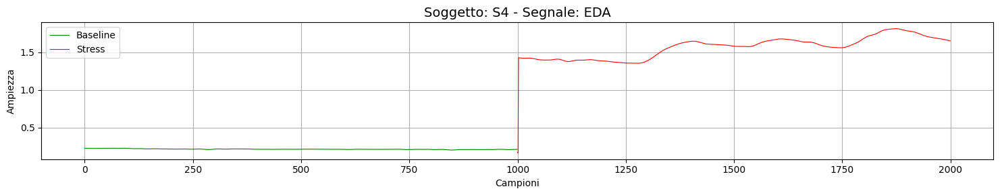

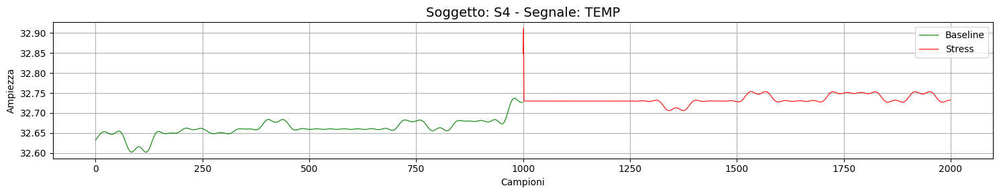


 Soggetto: S5


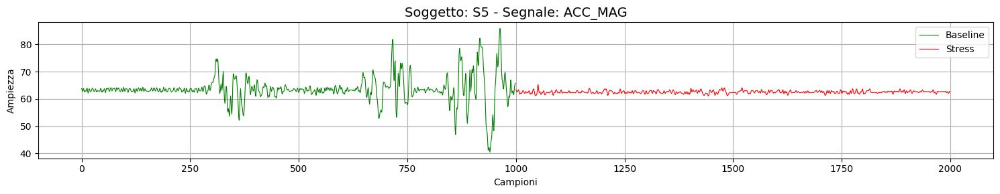

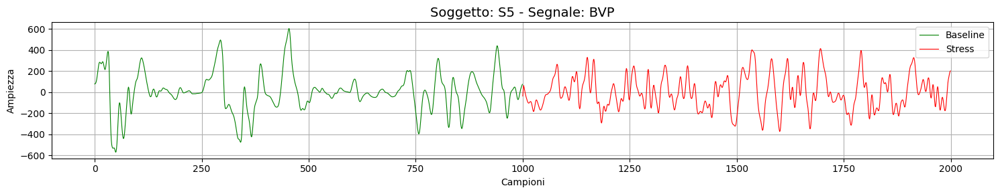

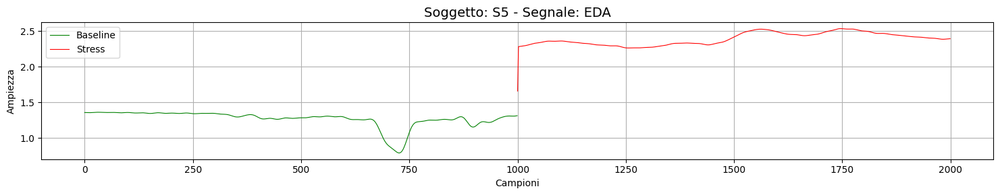

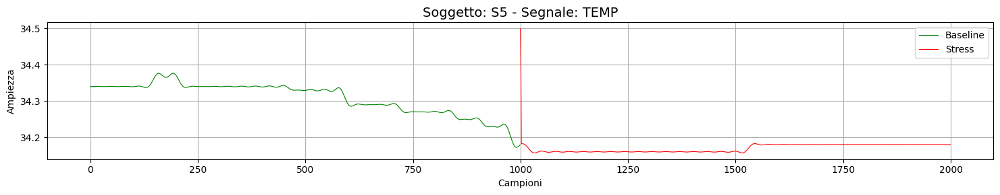


 Soggetto: S6


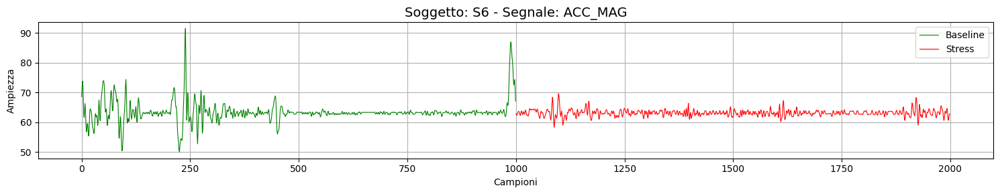

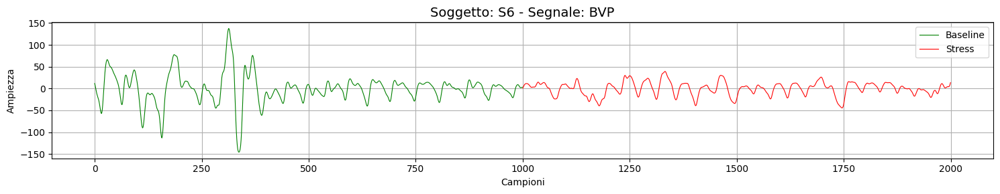

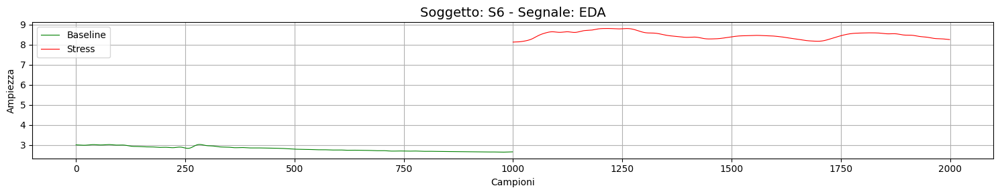

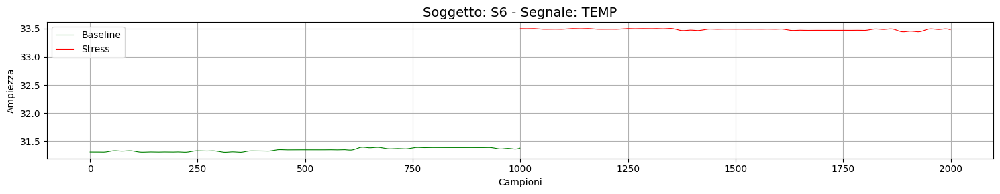


 Soggetto: S7


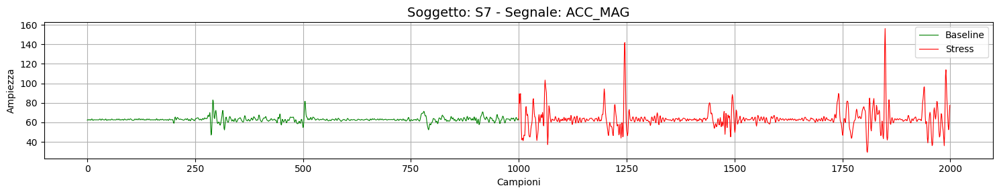

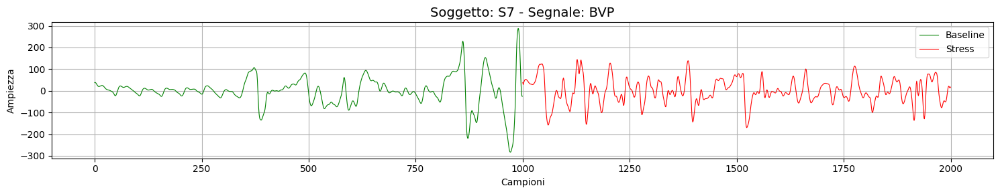

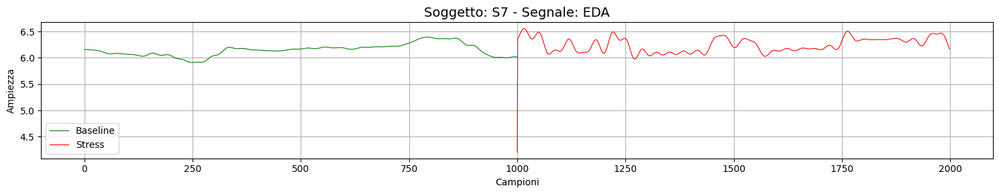

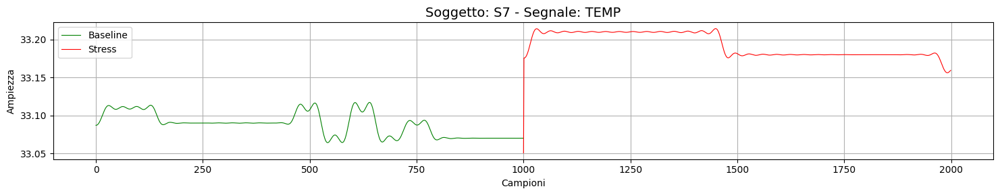


 Soggetto: S8


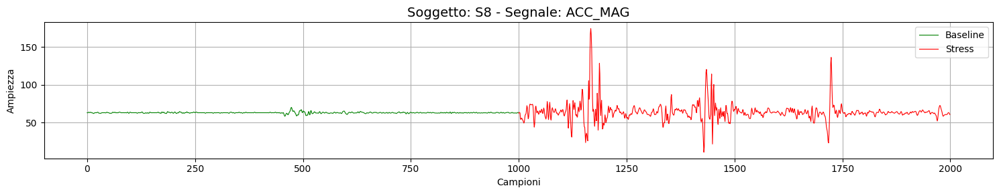

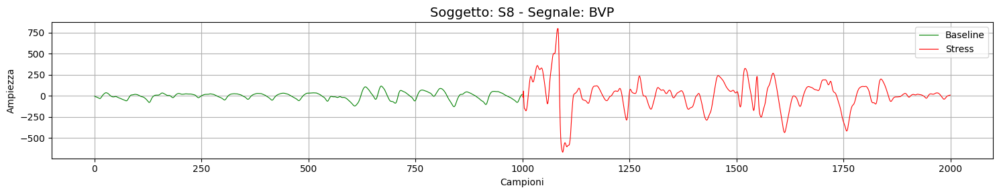

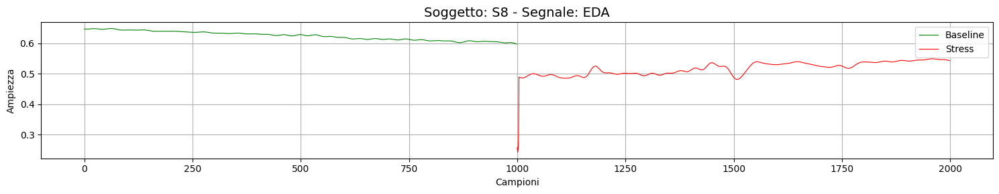

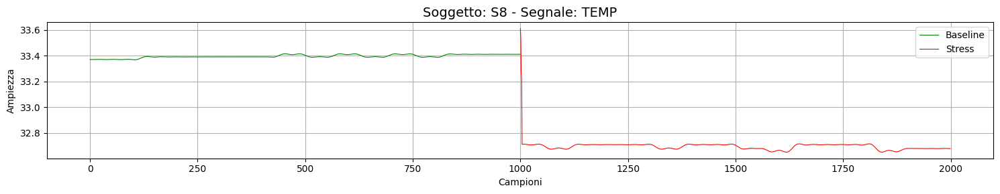


 Soggetto: S9


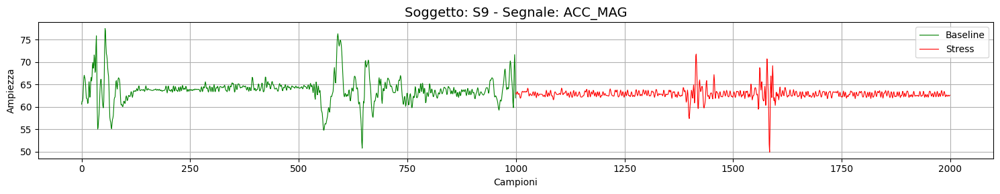

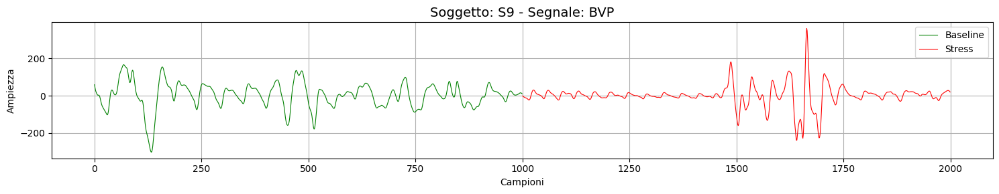

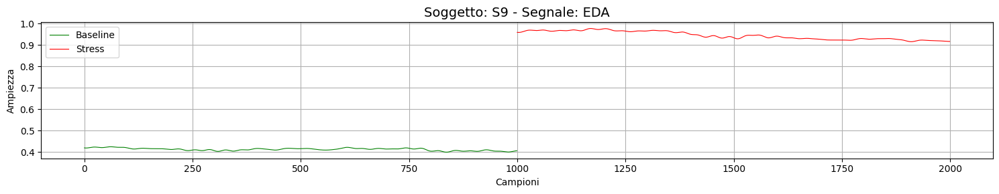

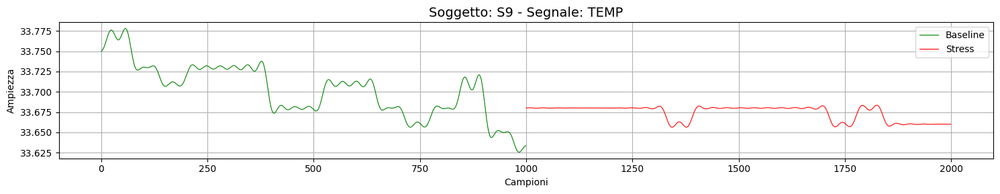


 Soggetto: S10


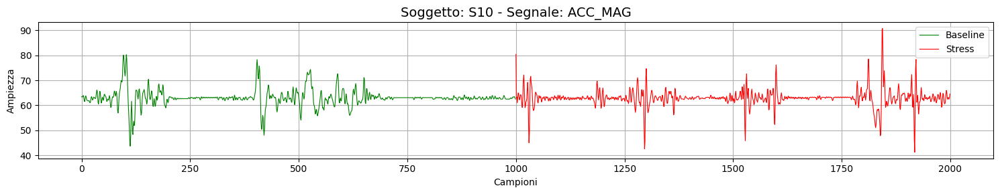

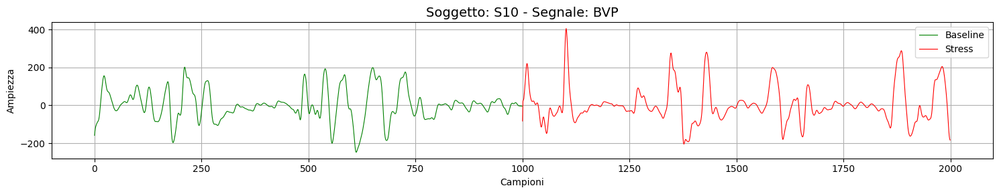

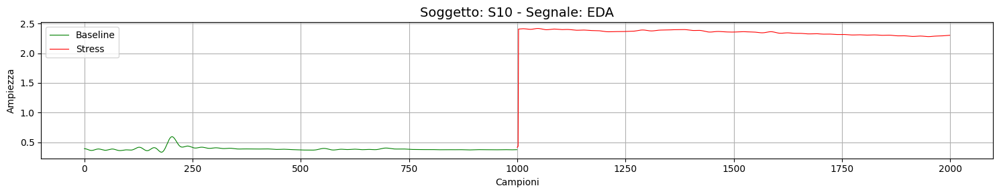

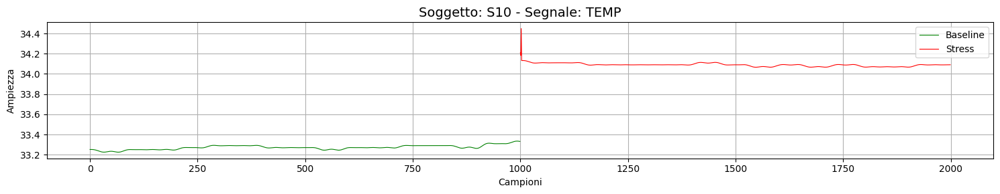


 Soggetto: S11


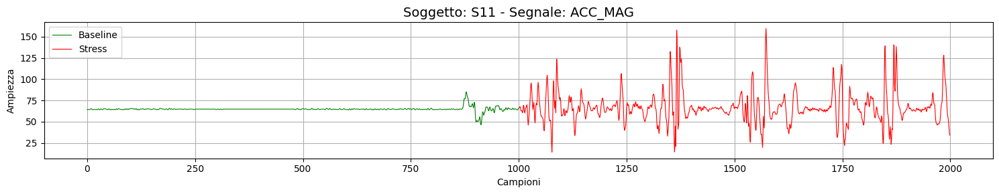

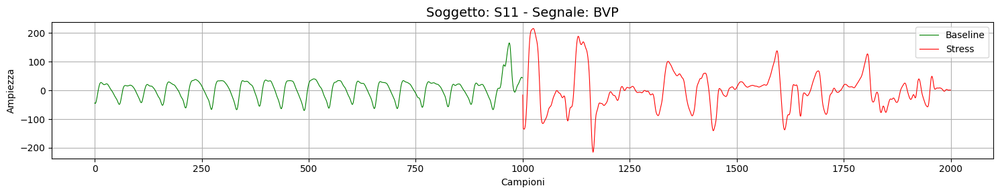

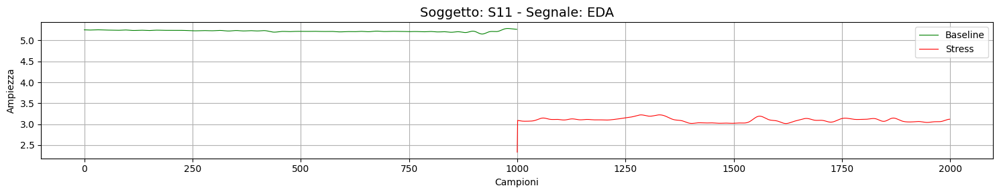

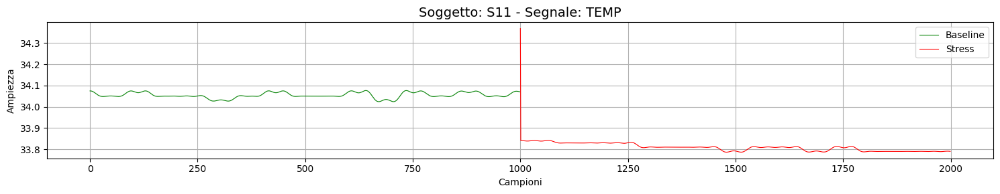


 Soggetto: S13


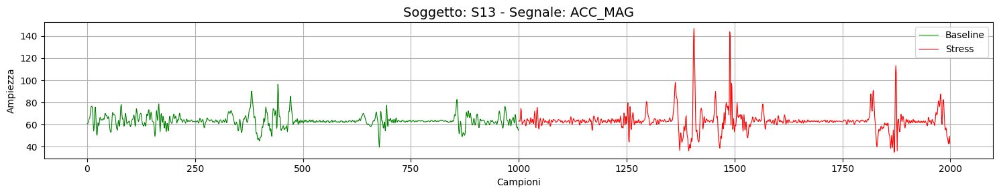

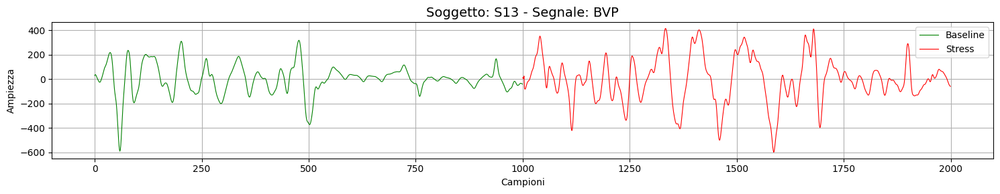

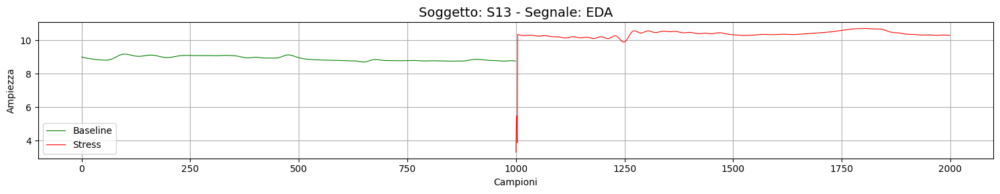

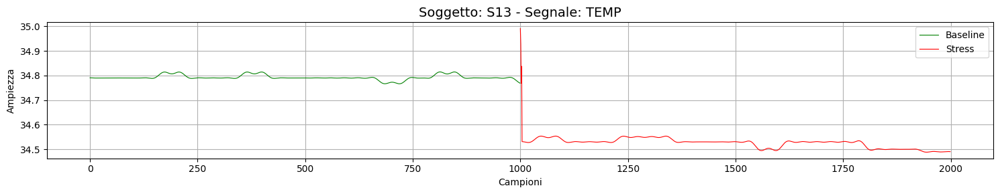


 Soggetto: S14


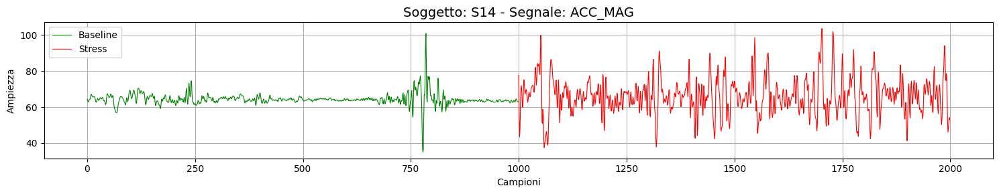

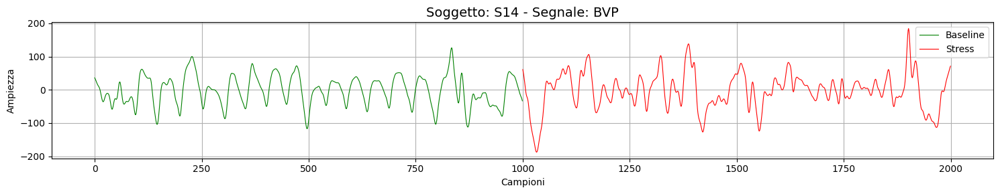

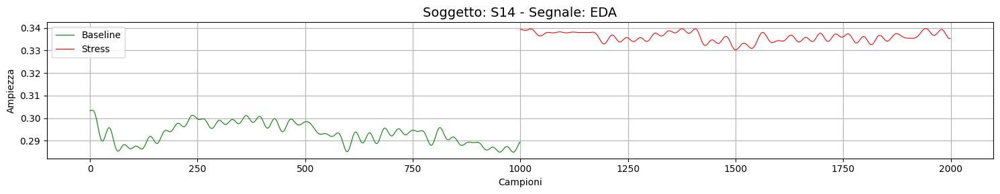

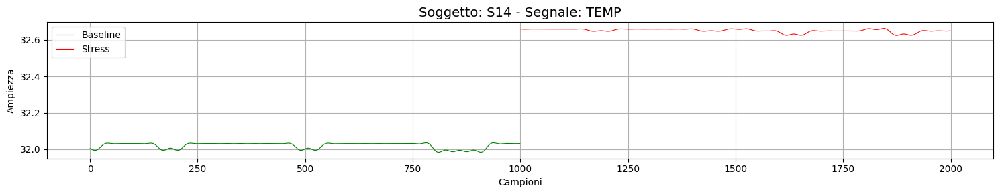


 Soggetto: S15


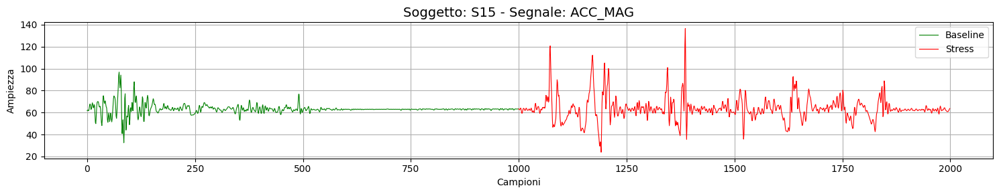

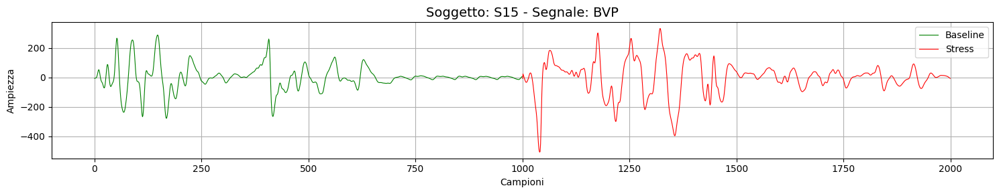

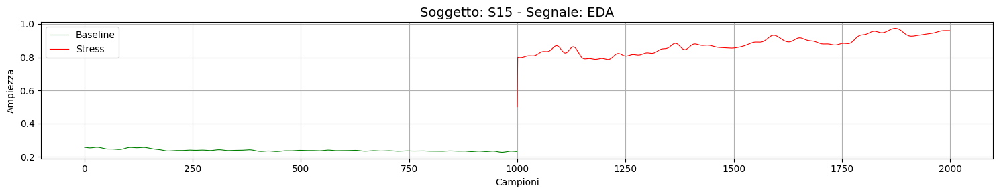

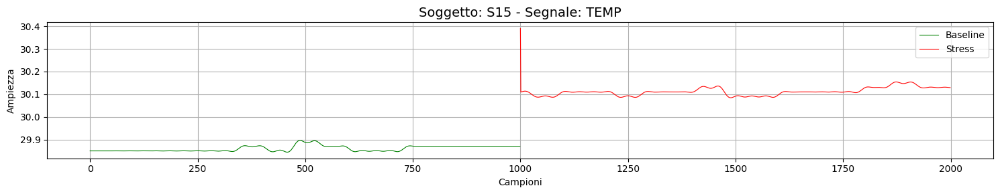


 Soggetto: S16


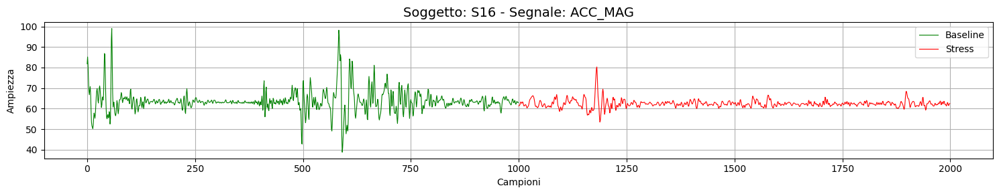

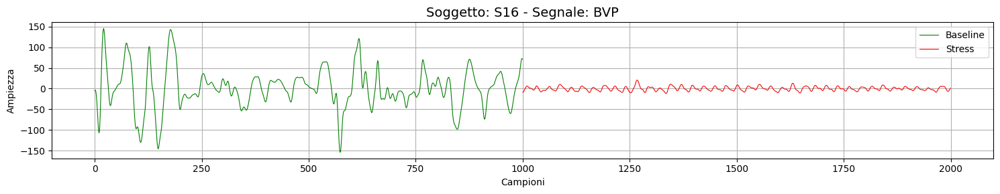

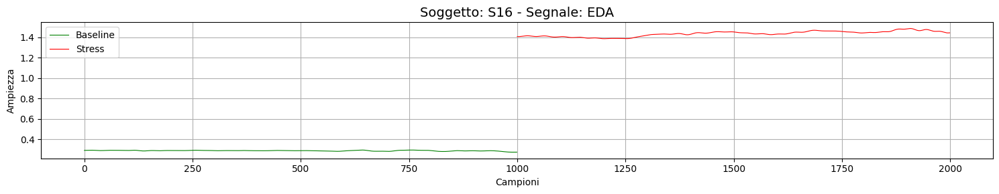

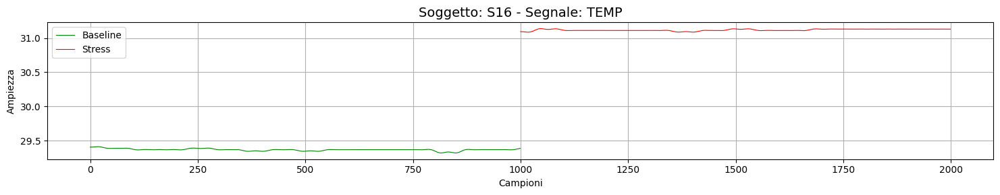


 Soggetto: S17


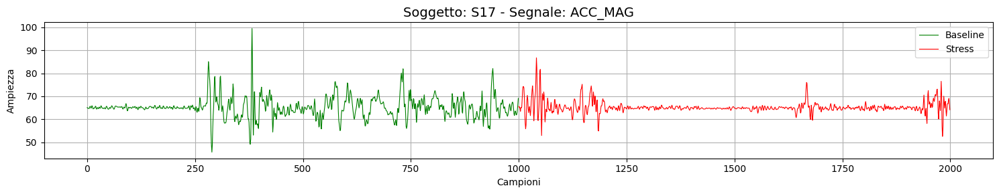

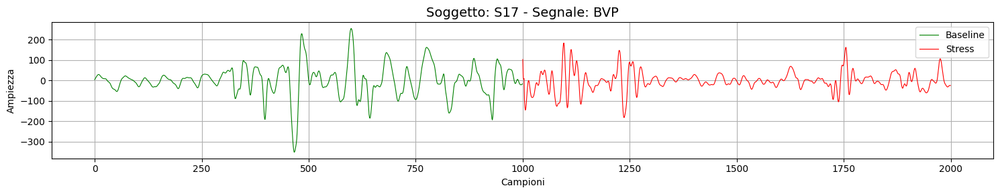

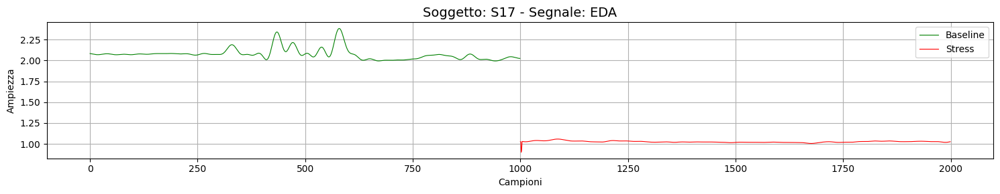

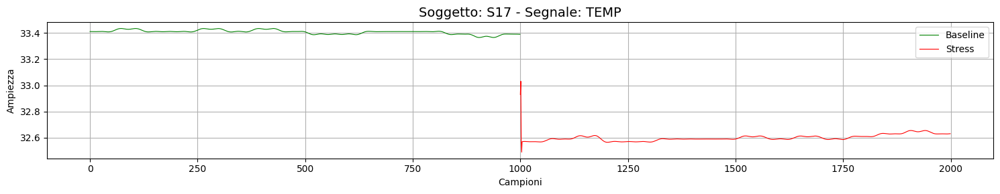

In [ ]:
plot_segnali_per_soggetto(df, n_points = 1000)

In [ ]:
pip install neurokit2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 696.5/696.5 kB 10.7 MB/s eta 0:00:00


In [ ]:
import neurokit2 as nk

In [ ]:
ppg_raw = df["bvp"].values

fs = 64

ppg_signals, ppg_info = nk.ppg_process(ppg_raw, sampling_rate=fs)

ppg_clean = ppg_signals["PPG_Clean"]

df['bvp_clean'] = ppg_clean

In [ ]:
def plot_raw_vs_clean_from_single_df(df, raw_col, clean_col, n_points=None):

    soggetti = df['subject'].unique()

    for soggetto in soggetti:
        df_soggetto = df[df['subject'] == soggetto]

        for condizione, label in zip(['Baseline', 'Stress'], [1, 2]):
            subset = df_soggetto[df_soggetto['label'] == label]
            raw_signal = subset[raw_col].values
            clean_signal = subset[clean_col].values

            if n_points:
                raw_signal = raw_signal[:n_points]
                clean_signal = clean_signal[:n_points]

            plt.figure(figsize=(15, 3))
            plt.plot(raw_signal, label='Raw', color='gray', alpha=0.5)
            plt.plot(clean_signal, label='Clean', color='blue', alpha=0.8)
            plt.title(f"Soggetto: {soggetto} - Condizione: {condizione} - Segnale: {raw_col.upper()}")
            plt.xlabel("Campioni")
            plt.ylabel("Ampiezza")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()

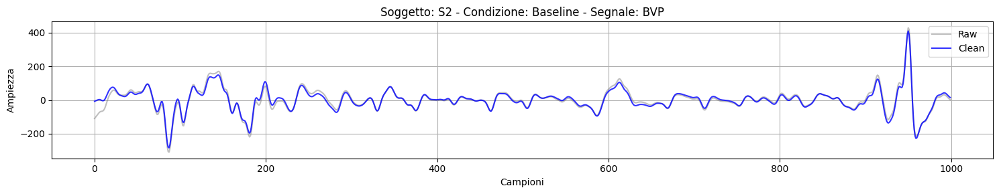

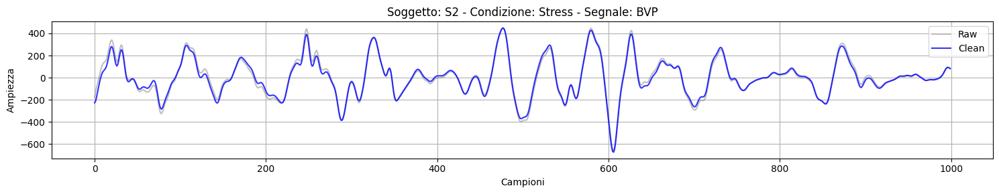

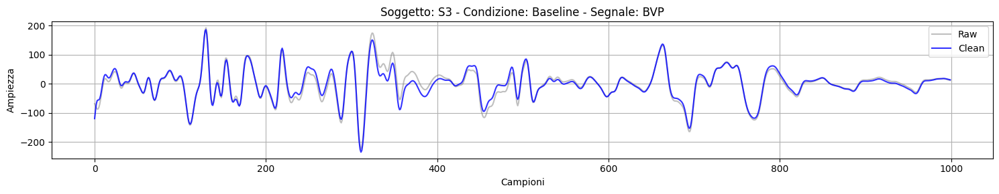

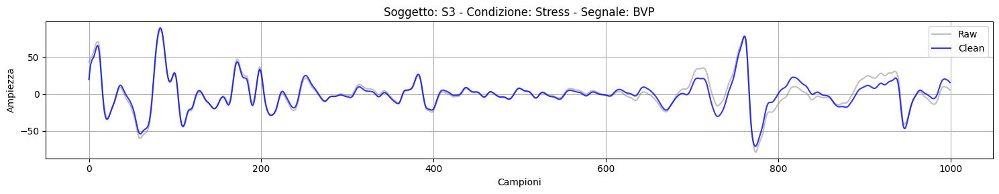

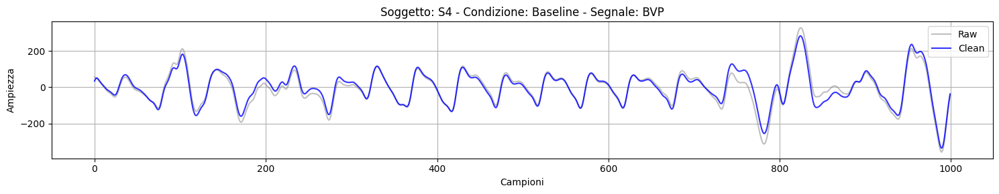

...

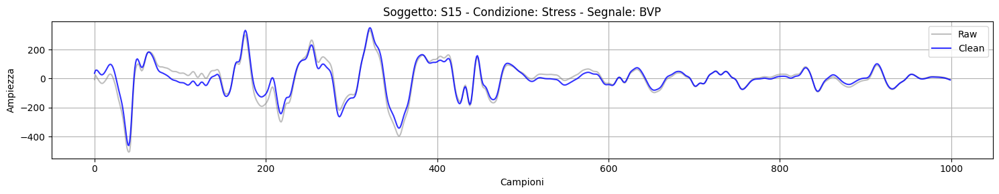

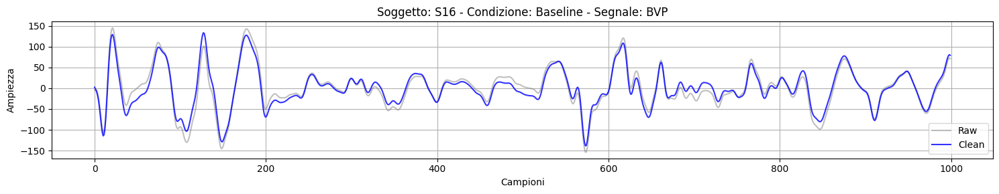

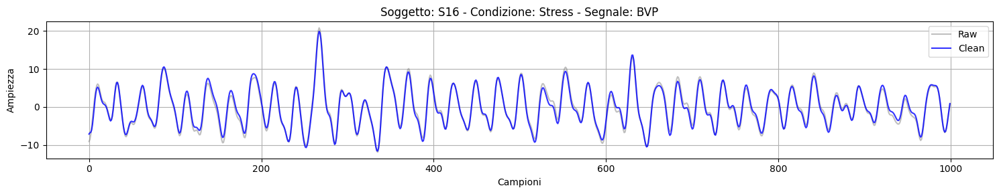

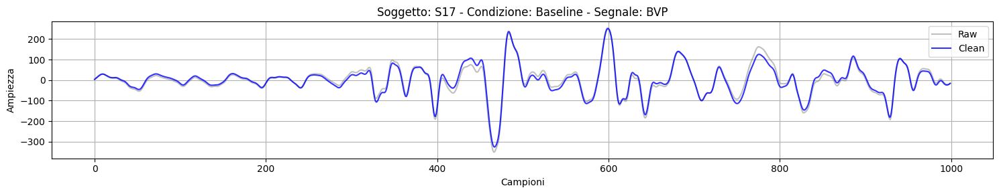

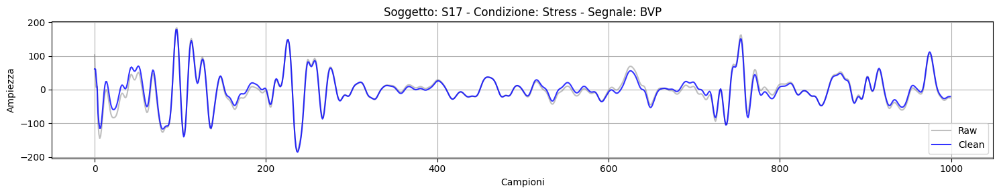

In [ ]:
plot_raw_vs_clean_from_single_df(df, 'bvp', 'bvp_clean', n_points = 1000)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from scipy.signal import find_peaks

# Parametri
fs = 64  # frequenza di campionamento
window_sec = 45
overlap = 0.75
window_size = int(fs * window_sec)
step_size = int(window_size * (1 - overlap))

# Lista per raccogliere le feature
features_list = []

# Scorri per finestra
for start in range(0, len(df) - window_size, step_size):
    window = df["bvp_clean"].iloc[start:start + window_size].values
    label = df["label"].iloc[start]
    subject = df["subject"].iloc[start]

    try:
        # HRV features (NeuroKit2)
        signals, info = nk.ppg_peaks(window, sampling_rate=fs)
        hrv_features = nk.hrv(info, sampling_rate=fs, show=False)

        # --- Time-domain features manuali (Scipy) ---
        peaks, _ = find_peaks(window, distance=fs * 0.5, height=0)
        if len(peaks) < 2:
            raise ValueError("Troppi pochi picchi")

        # Amplitude
        amplitudes = window[peaks]
        amp_mean = np.mean(amplitudes)

        # Rise time
        rise_times = []
        for peak in peaks:
            if peak == 0:
                continue
            min_idx = np.argmin(window[:peak])
            rise_time = (peak - min_idx) / fs
            rise_times.append(rise_time)
        rise_time_mean = np.mean(rise_times)

        # Duration (IBI)
        ibi = np.diff(peaks) / fs
        duration_mean = np.mean(ibi)

        # Inserisci le feature nel DataFrame
        hrv_features["PPG_Amplitude"] = amp_mean
        hrv_features["PPG_RiseTime"] = rise_time_mean
        hrv_features["PPG_Duration"] = duration_mean
        hrv_features["label"] = label
        hrv_features["subject"] = subject

        features_list.append(hrv_features)

    except Exception as e:
        print(f"Errore nella finestra {start}-{start + window_size}: {e}")

# Combina tutte le feature in un unico DataFrame
bvp_features = pd.concat(features_list, ignore_index=True) if features_list else pd.DataFrame()

In [ ]:
print("Shape of BVP Features:",bvp_features.shape)
bvp_features.head()

Shape of BVP Features: (2448, 88)


,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC,PPG_Amplitude,PPG_RiseTime,PPG_Duration,label,subject,HRV_DFA_alpha2
0,738.541667,253.074099,NaN,NaN,NaN,NaN,NaN,NaN,354.564338,357.606967,...,1.779527,2.046824,3.651696,1.279826,133.201560,7.734091,0.823785,1,S2,NaN
1,722.848361,235.343513,NaN,NaN,NaN,NaN,NaN,NaN,325.385388,328.131305,...,1.844832,2.035720,4.387905,1.263928,151.267073,6.347159,0.828125,1,S2,NaN
2,782.645089,354.409580,NaN,NaN,NaN,NaN,NaN,NaN,473.564293,477.829608,...,1.651480,2.044290,1.987681,1.348136,128.584839,12.609375,0.859375,1,S2,NaN
3,807.002315,233.974843,NaN,NaN,NaN,NaN,NaN,NaN,290.665573,293.392631,...,1.594843,1.944239,3.416743,1.278864,78.838619,21.433894,0.854473,1,S2,NaN
4,794.034091,190.397436,NaN,NaN,NaN,NaN,NaN,NaN,237.669743,239.901433,...,1.752883,1.965215,3.988297,1.261388,69.606509,17.459659,0.808738,1,S2,NaN


In [ ]:
bvp_features = bvp_features.replace([np.inf, -np.inf], np.nan)

In [ ]:
bvp_features.isna().sum()

,0
HRV_MeanNN,0
HRV_SDNN,0
HRV_SDANN1,2448
HRV_SDNNI1,2448
HRV_SDANN2,2448
...,...
PPG_RiseTime,0
PPG_Duration,0
label,0
subject,0


In [ ]:
def drop_columns_with_nans(df, threshold=0.5):

    nan_ratio = df.isna().mean()
    columns_to_keep = nan_ratio[nan_ratio <= threshold].index
    return df[columns_to_keep]

In [ ]:
bvp_features = drop_columns_with_nans(bvp_features)

In [ ]:
bvp_features.isna().sum()

,0
HRV_MeanNN,0
HRV_SDNN,0
HRV_RMSSD,0
HRV_SDSD,0
HRV_CVNN,0
...,...
PPG_Amplitude,0
PPG_RiseTime,0
PPG_Duration,0
label,0


In [ ]:
bvp_features = bvp_features.fillna(bvp_features.median(numeric_only=True))

In [ ]:
sum(bvp_features.isna().sum())

0

In [ ]:
def drop_highly_correlated_features(df, threshold=0.8, exclude_cols=['label', 'subject']):

    df_corr = df.drop(columns=exclude_cols)
    corr_matrix = df_corr.corr().abs()

    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

    df_reduced = df.drop(columns=to_drop)

    for col in exclude_cols:
        if col in df.columns and col not in df_reduced.columns:
            df_reduced[col] = df[col]

    return df_reduced, to_drop

In [ ]:
bvp_features, removed_cols = drop_highly_correlated_features(bvp_features, exclude_cols=['label', 'subject'])

print("Colonne rimosse:", removed_cols)
print("Dimensione dataset:", bvp_features.shape)

Colonne rimosse: ['HRV_RMSSD', 'HRV_SDSD', 'HRV_CVNN', 'HRV_CVSD', 'HRV_MCVNN', 'HRV_IQRNN', 'HRV_Prc80NN', 'HRV_pNN20', 'HRV_MaxNN', 'HRV_TP', 'HRV_LnHF', 'HRV_SD1', 'HRV_SD2', 'HRV_SD1SD2', 'HRV_S', 'HRV_CSI', 'HRV_CVI', 'HRV_CSI_Modified', 'HRV_IALS', 'HRV_PSS', 'HRV_SI', 'HRV_AI', 'HRV_C1a', 'HRV_SD1d', 'HRV_SD1a', 'HRV_C2a', 'HRV_SD2d', 'HRV_SD2a', 'HRV_Ca', 'HRV_SDNNd', 'HRV_SDNNa', 'HRV_MFDFA_alpha1_Delta', 'HRV_MFDFA_alpha1_Increment', 'HRV_ShanEn', 'HRV_RCMSEn']
Dimensione dataset: (2448, 44)


In [ ]:
def plot_numerical_features(df, label_col="label"):

    numerical_cols = df.select_dtypes(include='number').columns.drop(label_col, errors='ignore')

    for col in numerical_cols:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        mean = df[col].mean()
        median = df[col].median()
        std_dev = df[col].std()
        iqr = df[col].quantile(0.75) - df[col].quantile(0.25)
        skewness = stats.skew(df[col].dropna())
        kurt = stats.kurtosis(df[col].dropna())

        sns.histplot(df[col], bins=50, kde=True, ax=axes[0], color='steelblue')
        axes[0].set_title(f"Distribution of {col}")
        axes[0].set_ylabel("Density")

        sns.boxplot(y=df[col], ax=axes[1], color='steelblue')
        axes[1].set_title(f"Boxplot of {col}")

        stats.probplot(df[col].dropna(), dist="norm", plot=axes[2])
        axes[2].set_title(f"QQ-plot of {col}")

        stat_text = (
            f"Mean: {mean:.2f}\n"
            f"Median: {median:.2f}\n"
            f"SD: {std_dev:.2f}\n"
            f"IQR: {iqr:.2f}\n"
            f"Skewness: {skewness:.2f}\n"
            f"Kurtosis: {kurt:.2f}"
        )

        axes[0].text(
            0.02, 0.98, stat_text, transform=axes[0].transAxes,
            fontsize=10, verticalalignment='top',
            bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
        )

        plt.tight_layout()
        plt.show()

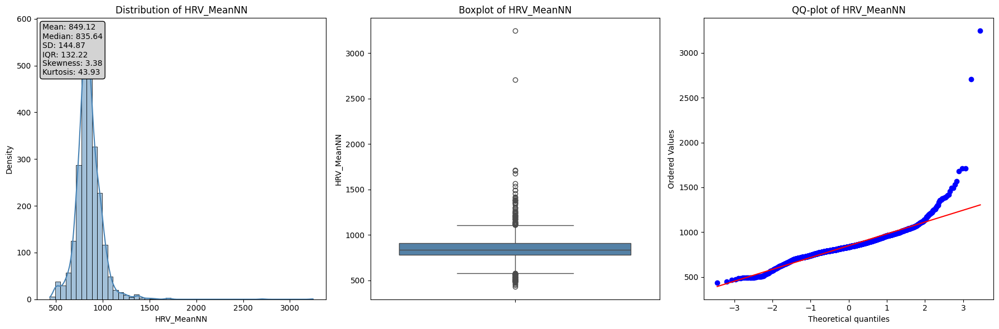

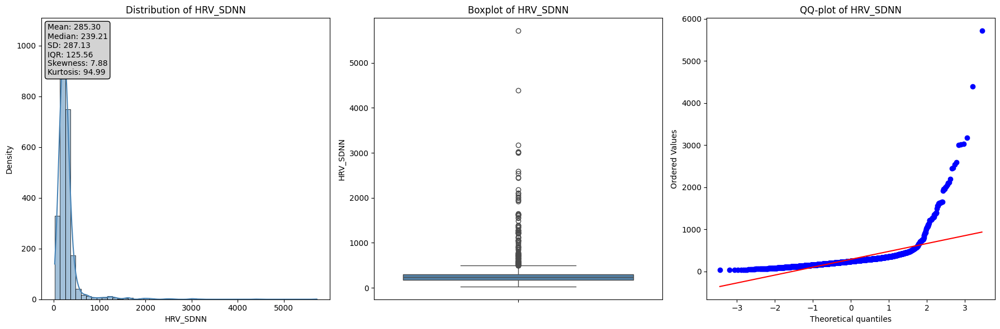

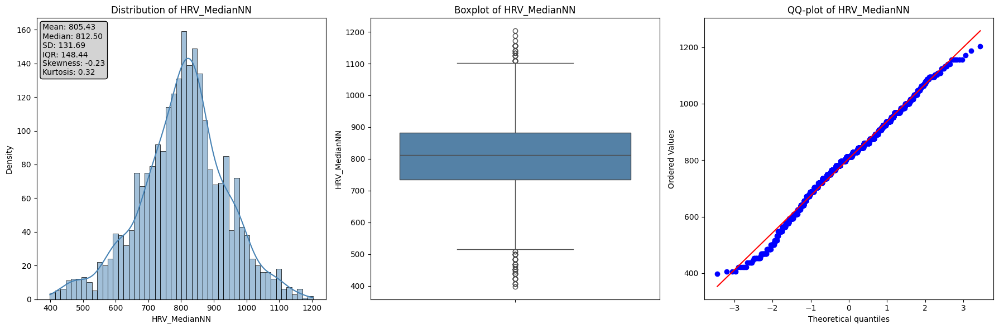

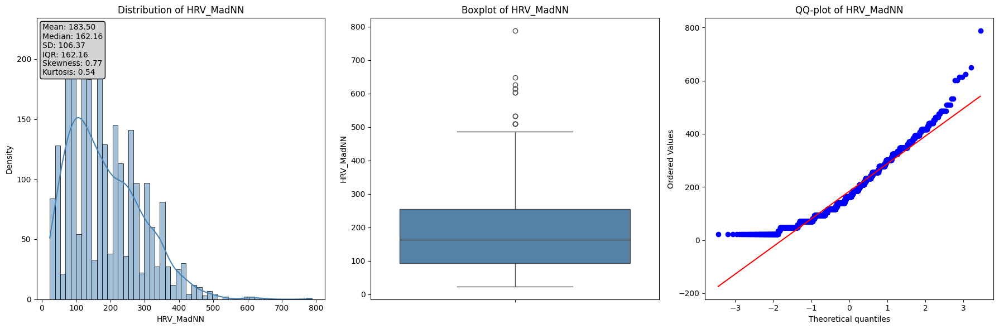

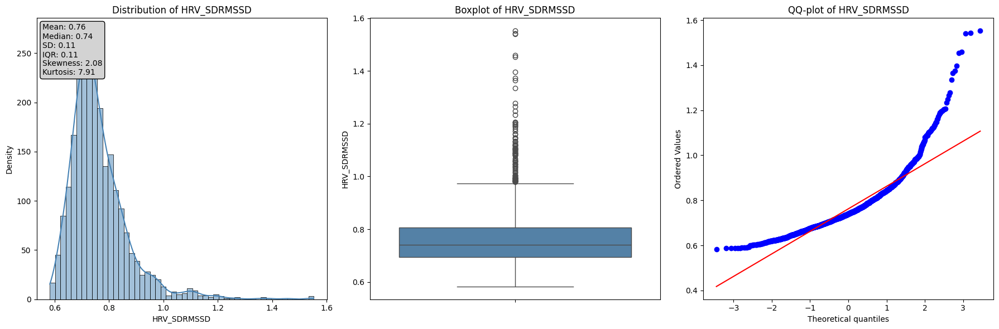

...

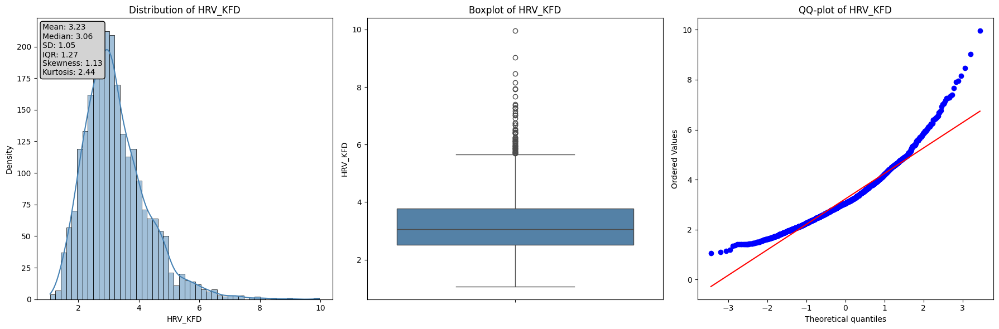

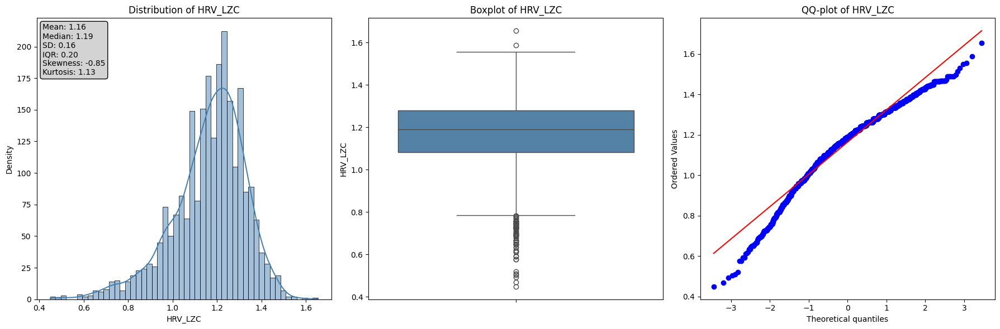

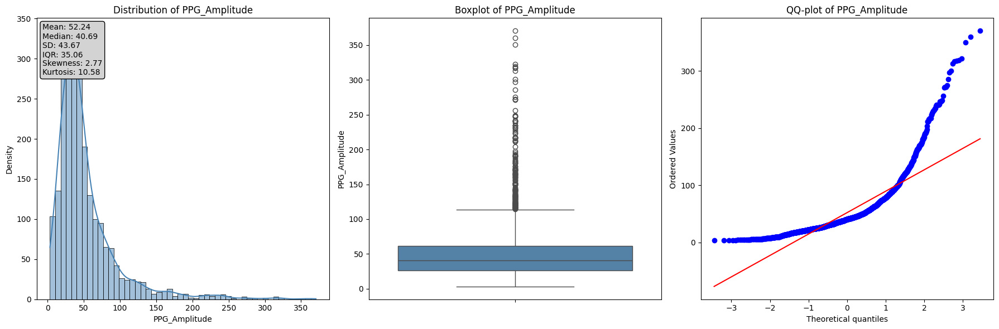

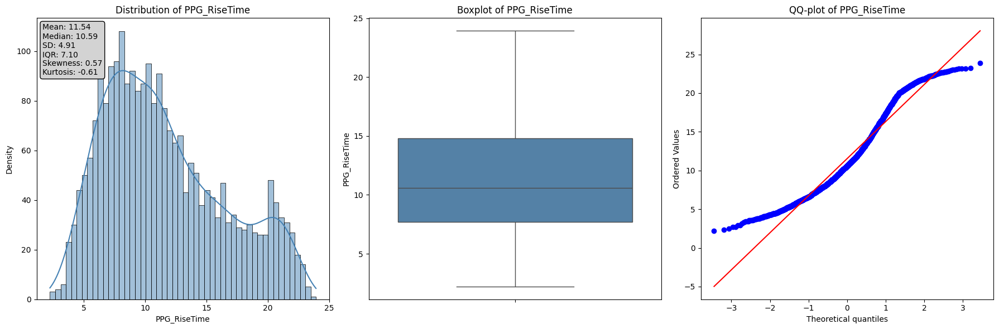

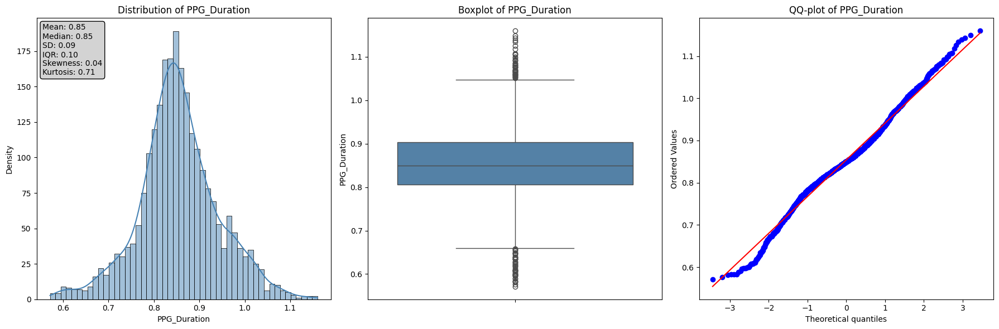

In [ ]:
plot_numerical_features(bvp_features)

In [ ]:
def shapiro_wilk_test(df, exclude_col='label', alpha=0.05):

    results = []
    numeric_cols = df.select_dtypes(include='number').columns.drop(exclude_col)

    for col in numeric_cols:
        stat, p_value = shapiro(df[col].dropna())
        is_normal = p_value > alpha
        results.append({
            "Feature": col,
            "W-Statistic": stat,
            "p-value": p_value,
            "Normally Distributed": "Yes" if is_normal else "No"
        })

    return pd.DataFrame(results).sort_values(by="p-value", ascending=True)

In [ ]:
shapiro_wilk_test(bvp_features)

,Feature,W-Statistic,p-value,Normally Distributed
13,HRV_LFHF,0.156030,4.230170e-74,No
1,HRV_SDNN,0.428310,2.049690e-66,No
18,HRV_GI,0.688534,2.715779e-55,No
29,HRV_MFDFA_alpha1_Fluctuation,0.721346,2.285217e-53,No
39,PPG_Amplitude,0.736048,1.921147e-52,No
14,HRV_LFn,0.810054,5.214799e-47,No
7,HRV_MinNN,0.815288,1.460388e-46,No
0,HRV_MeanNN,0.832277,4.919850e-45,No
22,HRV_Cd,0.834850,8.594076e-45,No
4,HRV_SDRMSSD,0.854354,7.563697e-43,No


In [ ]:
def test_label_subject_interaction(df, label_col='label', subject_col='subject', alpha=0.05):
    numerical_cols = df.drop(columns=[label_col, subject_col]).select_dtypes(include='number').columns
    summary = []

    for feature in numerical_cols:
        formula = f'{feature} ~ C({label_col}) + C({subject_col}) + C({label_col}):C({subject_col})'
        try:
            model = ols(formula, data=df).fit()
            anova_table = sm.stats.anova_lm(model, typ=2)

            p_label = anova_table.loc[f'C({label_col})', 'PR(>F)']
            p_subject = anova_table.loc[f'C({subject_col})', 'PR(>F)']
            p_interaction = anova_table.loc[f'C({label_col}):C({subject_col})', 'PR(>F)']

            summary.append({
                'feature': feature,
                'p_label': p_label,
                'p_subject': p_subject,
                'p_interaction': p_interaction,
                'significant_interaction': p_interaction < alpha
            })

        except Exception as e:
            summary.append({
                'feature': feature,
                'p_label': None,
                'p_subject': None,
                'p_interaction': None,
                'significant_interaction': None,
                'Error': str(e)
            })

    results_df = pd.DataFrame(summary)
    return results_df

In [ ]:
test_label_subject_interaction(bvp_features)

,feature,p_label,p_subject,p_interaction,significant_interaction
0,HRV_MeanNN,1.755064e-38,2.676710e-117,2.382147e-109,True
1,HRV_SDNN,7.614170e-18,2.828120e-56,1.853833e-21,True
2,HRV_MedianNN,1.697278e-254,0.000000e+00,3.755470e-263,True
3,HRV_MadNN,7.879030e-129,4.755739e-77,2.456935e-96,True
4,HRV_SDRMSSD,2.223801e-01,1.281784e-47,4.919114e-37,True
5,HRV_Prc20NN,0.000000e+00,2.353901e-136,4.565285e-121,True
6,HRV_pNN50,7.723374e-85,6.580394e-145,8.302832e-137,True
7,HRV_MinNN,1.794598e-51,2.006948e-35,9.869903e-18,True
8,HRV_HTI,4.407856e-72,2.425071e-64,1.079846e-76,True
9,HRV_TINN,1.039802e-100,4.178013e-143,4.306138e-56,True


In [ ]:
def plot_box_features(df, target="label", plots_per_row=3):

    continuous_features = df.select_dtypes(include='number').drop(columns=[target]).columns.tolist()
    num_features = len(continuous_features)
    num_rows = math.ceil(num_features / plots_per_row)

    fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(plots_per_row * 6, num_rows * 5))
    axes = axes.flatten()

    for i, feature in enumerate(continuous_features):
        sns.boxplot(
            data=df,
            x=target,
            y=feature,
            hue=target,
            ax=axes[i],
            legend=False,
            palette=["lightcoral", "lightblue"]
        )
        axes[i].set_title(f"Boxplot of {feature} by {target}")
        axes[i].set_xlabel(target)
        axes[i].set_ylabel(feature)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

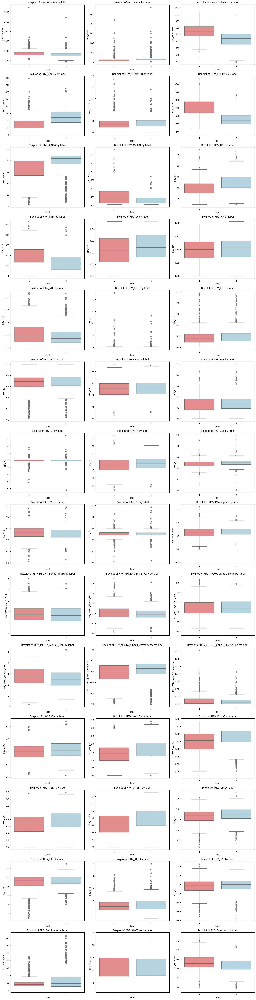

In [ ]:
plot_box_features(bvp_features)

In [ ]:
def mann_whitney_subjectwise(df, label_col='label', subject_col='subject', alpha=0.05, max_non_significant_subjects=5):
    subject_ids = df[subject_col].unique()
    features = [col for col in df.columns if col not in [label_col, subject_col] and pd.api.types.is_numeric_dtype(df[col])]

    non_significant_counts = {feature: 0 for feature in features}
    all_results = []

    for subject in subject_ids:
        df_s = df[df[subject_col] == subject]

        for feature in features:
            group1 = df_s[df_s[label_col] == 1][feature]
            group2 = df_s[df_s[label_col] == 2][feature]

            try:
                stat, p = mannwhitneyu(group1, group2, alternative='two-sided')
                if p > alpha:
                    non_significant_counts[feature] += 1
                all_results.append({
                    'subject': subject,
                    'feature': feature,
                    'U_stat': stat,
                    'p_value': p,
                    'significant': p < alpha
                })
            except:

                non_significant_counts[feature] += 1
                all_results.append({
                    'subject': subject,
                    'feature': feature,
                    'U_stat': None,
                    'p_value': None,
                    'significant': False
                })

    results_df = pd.DataFrame(all_results)

    to_drop = [feature for feature, count in non_significant_counts.items() if count > max_non_significant_subjects]

    return results_df, to_drop

In [ ]:
mw_results, features_to_drop = mann_whitney_subjectwise(bvp_features)

print("Feature da rimuovere:", features_to_drop)

Feature da rimuovere: ['HRV_LF', 'HRV_HF', 'HRV_VHF', 'HRV_LFHF', 'HRV_LFn', 'HRV_HFn', 'HRV_PIP', 'HRV_PAS', 'HRV_GI', 'HRV_PI', 'HRV_C1d', 'HRV_C2d', 'HRV_Cd', 'HRV_DFA_alpha1', 'HRV_MFDFA_alpha1_Width', 'HRV_MFDFA_alpha1_Peak', 'HRV_MFDFA_alpha1_Mean', 'HRV_MFDFA_alpha1_Asymmetry', 'HRV_ApEn', 'HRV_CMSEn', 'PPG_RiseTime']


In [ ]:
bvp_features = bvp_features.drop(columns=features_to_drop, axis = 1)

In [ ]:
print("Final Shape of BVP Features:", bvp_features.shape)
bvp_features.head()

Final Shape of BVP Features: (2448, 23)


,HRV_MeanNN,HRV_SDNN,HRV_MedianNN,HRV_MadNN,HRV_SDRMSSD,HRV_Prc20NN,HRV_pNN50,HRV_MinNN,HRV_HTI,HRV_TINN,...,HRV_FuzzyEn,HRV_MSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC,PPG_Amplitude,PPG_Duration,label,subject
0,738.541667,253.074099,687.5000,196.907812,0.713761,575.000,83.333333,328.125,15.0,78.125,...,1.616089,1.371418,1.779527,2.046824,3.651696,1.279826,133.201560,0.823785,1,S2
1,722.848361,235.343513,703.1250,231.656250,0.723276,500.000,90.163934,328.125,12.2,281.250,...,1.681222,1.219663,1.844832,2.035720,4.387905,1.263928,151.267073,0.828125,1,S2
2,782.645089,354.409580,796.8750,277.987500,0.748387,500.000,83.928571,328.125,14.0,531.250,...,1.404607,1.455942,1.651480,2.044290,1.987681,1.348136,128.584839,0.859375,1,S2
3,807.002315,233.974843,835.9375,150.576562,0.804962,603.125,66.666667,328.125,13.5,484.375,...,1.159319,0.858689,1.594843,1.944239,3.416743,1.278864,78.838619,0.854473,1,S2
4,794.034091,190.397436,812.5000,162.159375,0.801101,609.375,63.636364,437.500,11.0,62.500,...,1.203328,0.972955,1.752883,1.965215,3.988297,1.261388,69.606509,0.808738,1,S2


In [ ]:
eda_raw = df["eda"].values

fs = 64

eda_signals, eda_info = nk.eda_process(eda_raw, sampling_rate=fs)

eda_clean = eda_signals["EDA_Clean"]

df['eda_clean'] = eda_clean

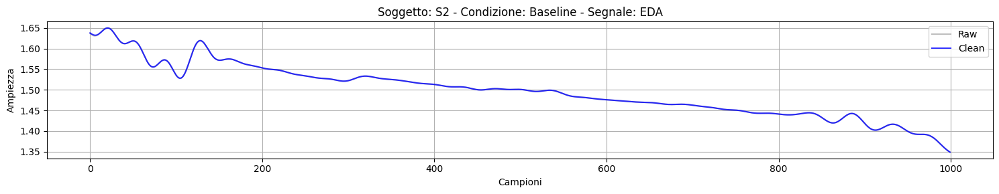

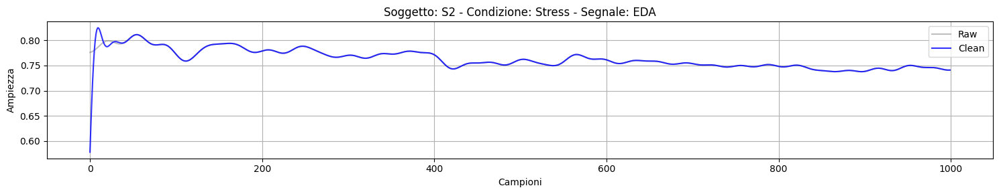

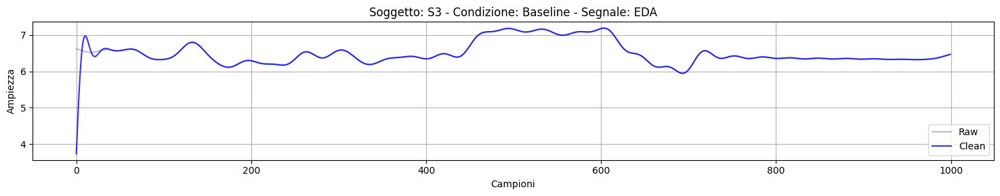

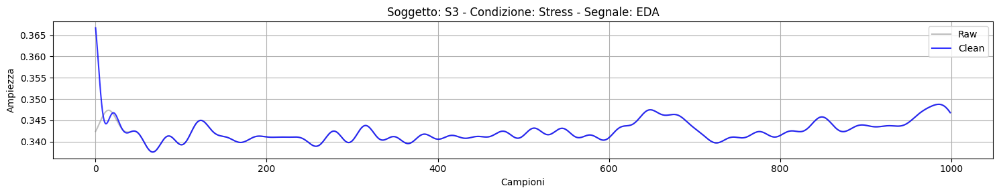

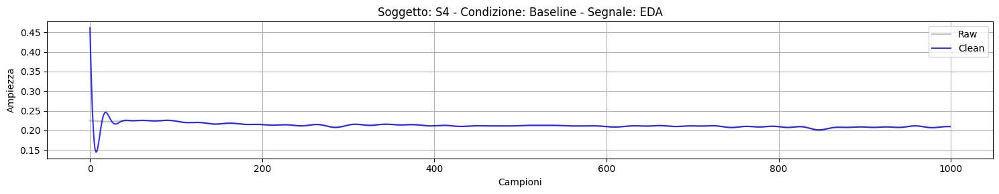

...

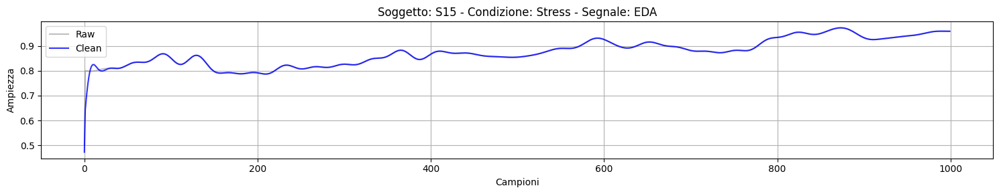

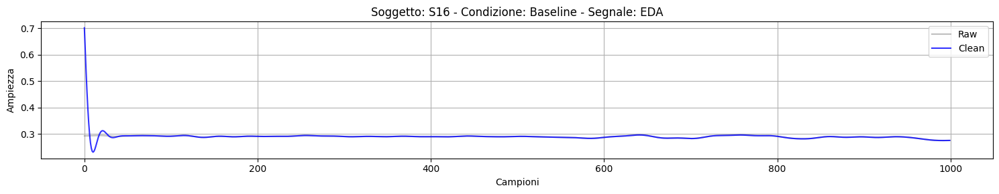

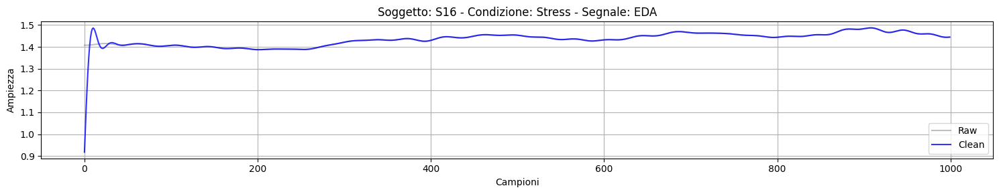

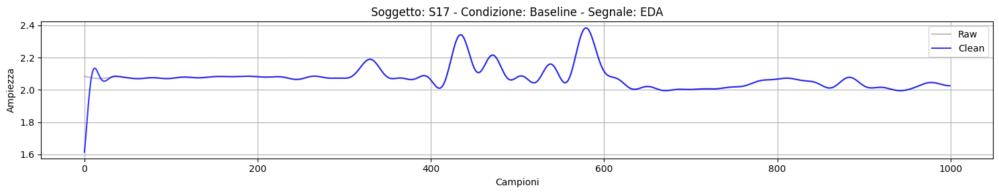

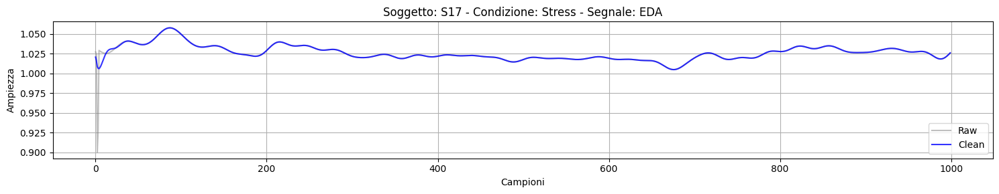

In [ ]:
plot_raw_vs_clean_from_single_df(df, 'eda', 'eda_clean', n_points = 1000)

In [ ]:
# Parametri
fs = 64  # Frequenza di campionamento
window_sec = 45
overlap = 0.75
window_size = int(fs * window_sec)
step_size = int(window_size * (1 - overlap))

# Lista per raccogliere le feature
eda_features_list = []

# Scorri per finestra
for start in range(0, len(df) - window_size, step_size):
    window_signal = df["eda_clean"].iloc[start:start+window_size].values
    label = df["label"].iloc[start]
    subject = df["subject"].iloc[start]

    try:
        # Estrai caratteristiche EDA da finestra
        eda_signals, eda_info = nk.eda_peaks(window_signal, sampling_rate=fs)
        features = nk.eda_intervalrelated(eda_signals, sampling_rate=fs)

        # Aggiungi metadati
        features["label"] = label
        features["subject"] = subject

        eda_features_list.append(features)

    except Exception as e:
        print(f"Errore nella finestra {start}-{start+window_size}: {e}")

# Combina tutte le feature in un unico DataFrame
if eda_features_list:
    eda_features = pd.concat(eda_features_list, ignore_index=True)
else:
    print("Nessuna finestra valida.")
    eda_features = pd.DataFrame()

In [ ]:
print("Shape of EDA features:", eda_features.shape)
eda_features.head()

Shape of EDA features: (2448, 7)


,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,EDA_Sympathetic,EDA_SympatheticN,EDA_Autocorrelation,label,subject
0,13.0,0.114257,NaN,NaN,NaN,1,S2
1,13.0,0.115145,NaN,NaN,NaN,1,S2
2,10.0,0.115030,NaN,NaN,NaN,1,S2
3,5.0,0.056022,NaN,NaN,NaN,1,S2
4,6.0,0.043394,NaN,NaN,NaN,1,S2


In [ ]:
eda_features.isna().sum()

,0
SCR_Peaks_N,0
SCR_Peaks_Amplitude_Mean,1
EDA_Sympathetic,2448
EDA_SympatheticN,2448
EDA_Autocorrelation,2448
label,0
subject,0


In [ ]:
eda_features = drop_columns_with_nans(eda_features)
eda_features = eda_features.fillna(eda_features.median(numeric_only=True))

In [ ]:
sum(eda_features.isna().sum())

0

In [ ]:
eda_features.head()

,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,label,subject
0,13.0,0.114257,1,S2
1,13.0,0.115145,1,S2
2,10.0,0.115030,1,S2
3,5.0,0.056022,1,S2
4,6.0,0.043394,1,S2


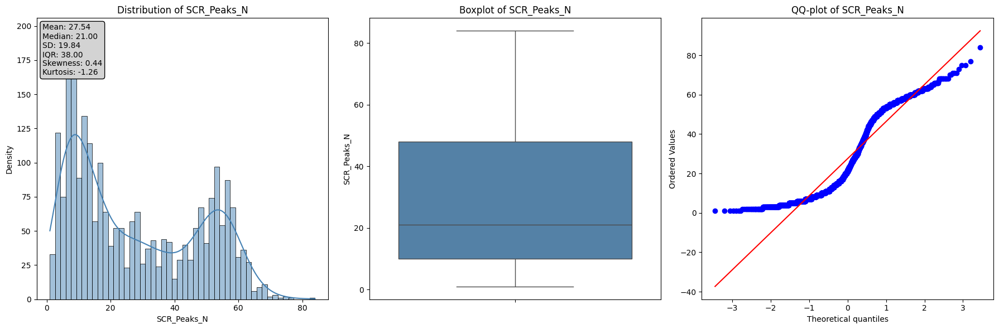

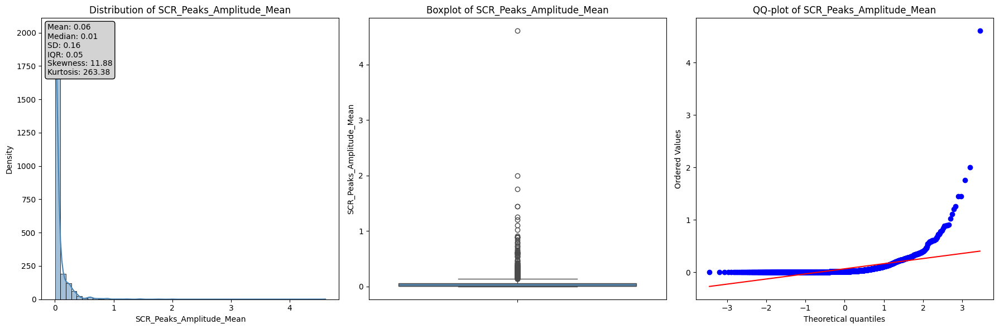

In [ ]:
plot_numerical_features(eda_features)

In [ ]:
shapiro_wilk_test(eda_features)

,Feature,W-Statistic,p-value,Normally Distributed
1,SCR_Peaks_Amplitude_Mean,0.358936,1.249448e-68,No
0,SCR_Peaks_N,0.897385,1.149803e-37,No


In [ ]:
test_label_subject_interaction(eda_features)

,feature,p_label,p_subject,p_interaction,significant_interaction
0,SCR_Peaks_N,1.368905e-187,6.400234e-112,3.129579e-44,True
1,SCR_Peaks_Amplitude_Mean,1.325731e-39,3.194253e-40,2.364991e-11,True


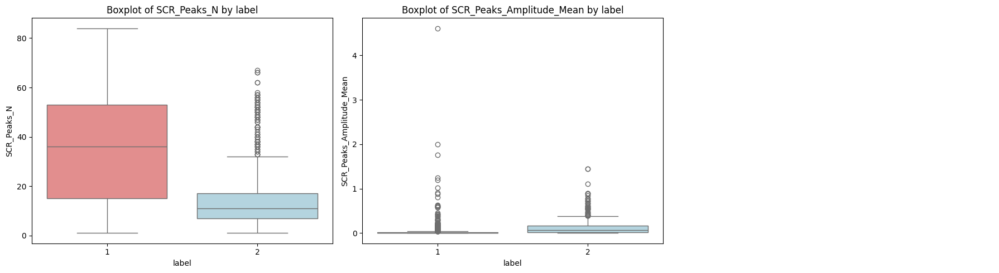

In [ ]:
plot_box_features(eda_features)

In [ ]:
mw_results, features_to_drop = mann_whitney_subjectwise(eda_features)

print("Feature da rimuovere:", features_to_drop)

Feature da rimuovere: []


In [ ]:
print("Final Shape of EDA Features:", eda_features.shape)
eda_features.head()

Final Shape of EDA Features: (2448, 4)


,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,label,subject
0,13.0,0.114257,1,S2
1,13.0,0.115145,1,S2
2,10.0,0.115030,1,S2
3,5.0,0.056022,1,S2
4,6.0,0.043394,1,S2


In [ ]:
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

In [ ]:
def acc_denoise(acc_signal, fs):

    b_high, a_high = butter_highpass(0.5, fs)
    acc_signal = filtfilt(b_high, a_high, acc_signal)

    b_low, a_low = butter_lowpass(20.0, fs)
    acc_signal = filtfilt(b_low, a_low, acc_signal)

    return acc_signal

In [ ]:
fs = 64
df['acc_mag_clean'] = acc_denoise(df['acc_mag'].values, fs)

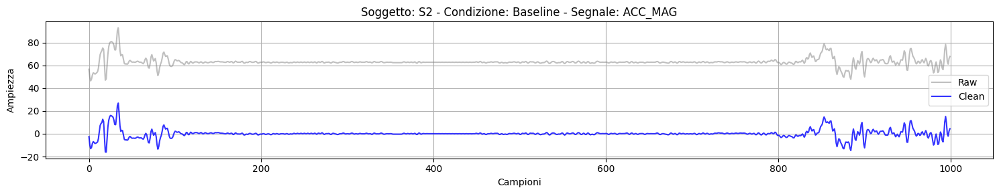

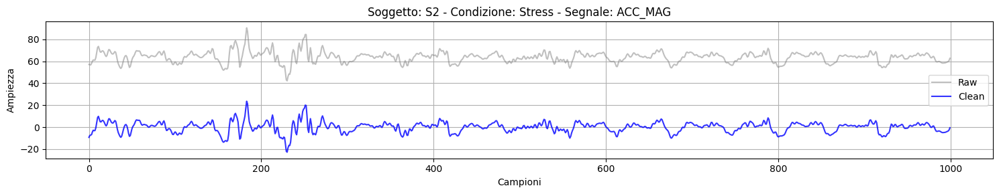

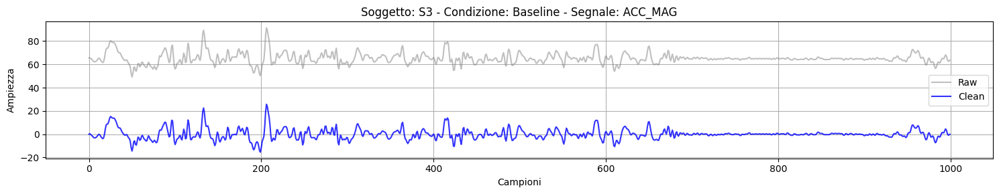

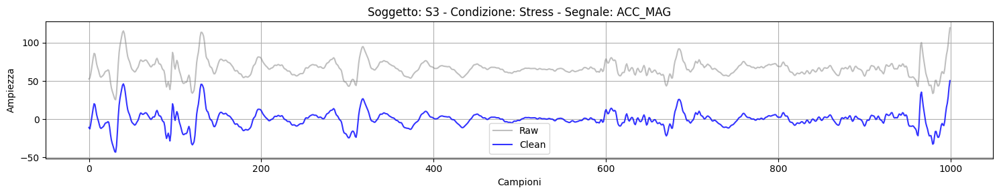

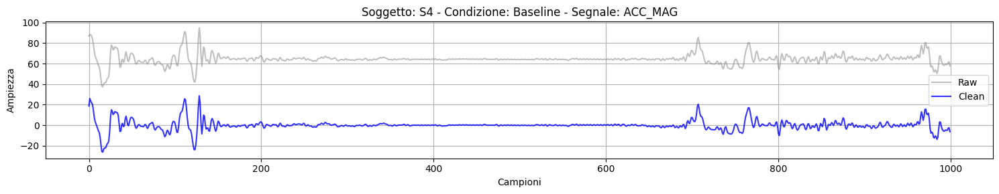

...

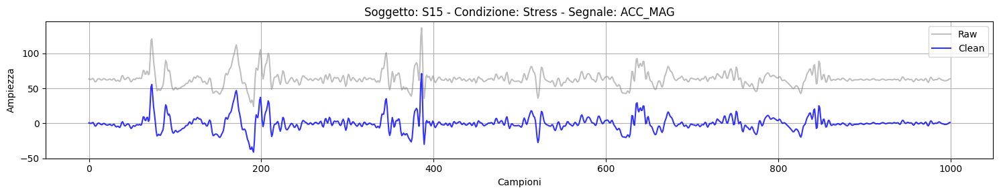

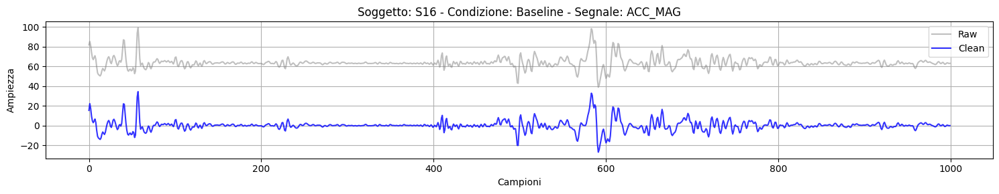

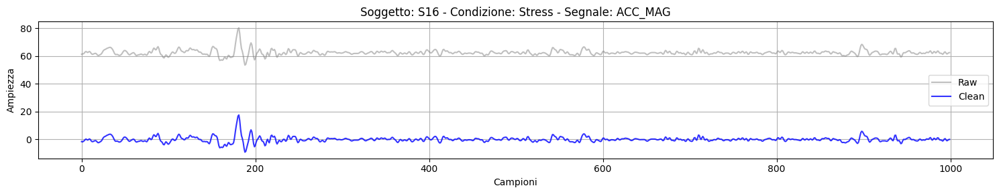

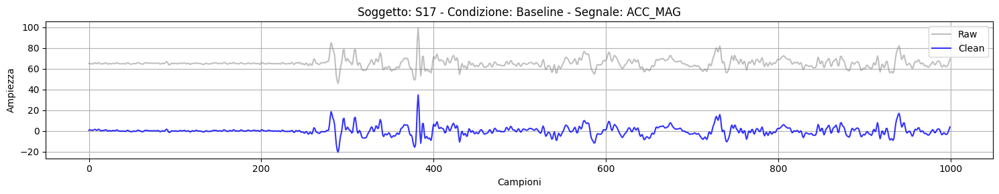

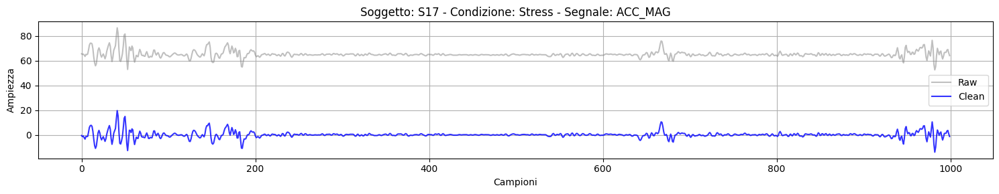

In [ ]:
plot_raw_vs_clean_from_single_df(df, 'acc_mag', 'acc_mag_clean', n_points = 1000)

In [ ]:
import scipy.signal

# Parametri
fs = 64  # frequenza di campionamento
window_sec = 45
overlap = 0.75
window_size = int(fs * window_sec)
step_size = int(window_size * (1 - overlap))

# Lista per salvare le feature
acc_features_list = []

# Estrai feature per ciascun soggetto
for subject_id in df["subject"].unique():
    print(f"Elaborazione soggetto {subject_id}")
    df_s = df[df["subject"] == subject_id].reset_index(drop=True)

    for start in range(0, len(df_s) - window_size + 1, step_size):
        end = start + window_size
        window = df_s["acc_mag"].iloc[start:end].values
        label = df_s["label"].iloc[start]

        if len(window) == 0:
            continue

        try:
            features = {
                "AccMag_Mean": np.mean(window),
                "AccMag_Std": np.std(window),
                "AccMag_Max": np.max(window),
                "AccMag_Min": np.min(window),
                "AccMag_Range": np.max(window) - np.min(window),
                "AccMag_Median": np.median(window),
                "AccMag_IQR": np.percentile(window, 75) - np.percentile(window, 25),
                "AccMag_Skew": scipy.stats.skew(window),
                "AccMag_Kurtosis": scipy.stats.kurtosis(window),
                "label": label,
                "subject": subject_id,
            }
            acc_features_list.append(features)

        except Exception as e:
            print(f"Errore finestra {start}-{end}: {e}")
            continue

# Combina le feature in un DataFrame
acc_features = pd.DataFrame(acc_features_list)

Elaborazione soggetto S2
Elaborazione soggetto S3
Elaborazione soggetto S4
Elaborazione soggetto S5
Elaborazione soggetto S6
Elaborazione soggetto S7
Elaborazione soggetto S8
Elaborazione soggetto S9
Elaborazione soggetto S10
Elaborazione soggetto S11
Elaborazione soggetto S13
Elaborazione soggetto S14
Elaborazione soggetto S15
Elaborazione soggetto S16
Elaborazione soggetto S17


In [ ]:
print("Shape of ACC Features", acc_features.shape)
acc_features.head()

Shape of ACC Features (2399, 11)


,AccMag_Mean,AccMag_Std,AccMag_Max,AccMag_Min,AccMag_Range,AccMag_Median,AccMag_IQR,AccMag_Skew,AccMag_Kurtosis,label,subject
0,63.734168,6.939395,144.041949,18.406041,125.635908,62.937235,2.941551,1.659809,16.127938,1,S2
1,63.839605,6.882462,144.041949,18.406041,125.635908,63.292970,4.176210,1.591902,16.330914,1,S2
2,63.730685,6.205541,144.041949,18.406041,125.635908,63.261363,2.092806,2.029033,24.598794,1,S2
3,63.251729,2.853339,83.068015,33.674916,49.393098,63.110501,1.226706,-0.017353,15.875609,1,S2
4,63.253129,2.680728,82.103593,33.674916,48.428677,63.157419,1.250813,-0.726639,17.682207,1,S2


In [ ]:
acc_features.isna().sum()

,0
AccMag_Mean,0
AccMag_Std,0
AccMag_Max,0
AccMag_Min,0
AccMag_Range,0
AccMag_Median,0
AccMag_IQR,0
AccMag_Skew,0
AccMag_Kurtosis,0
label,0


In [ ]:
acc_features, removed_cols = drop_highly_correlated_features(acc_features, exclude_cols=['label', 'subject'])

print("Colonne rimosse:", removed_cols)
print("Dimensione dataset:", acc_features.shape)

Colonne rimosse: ['AccMag_Max', 'AccMag_Min', 'AccMag_Range', 'AccMag_Median']
Dimensione dataset: (2399, 7)


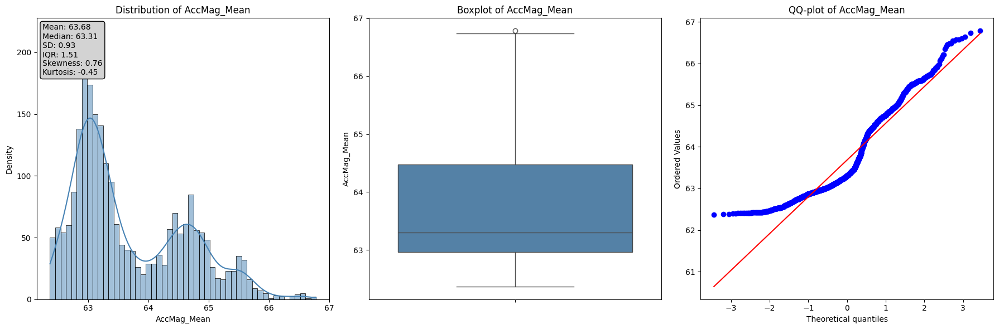

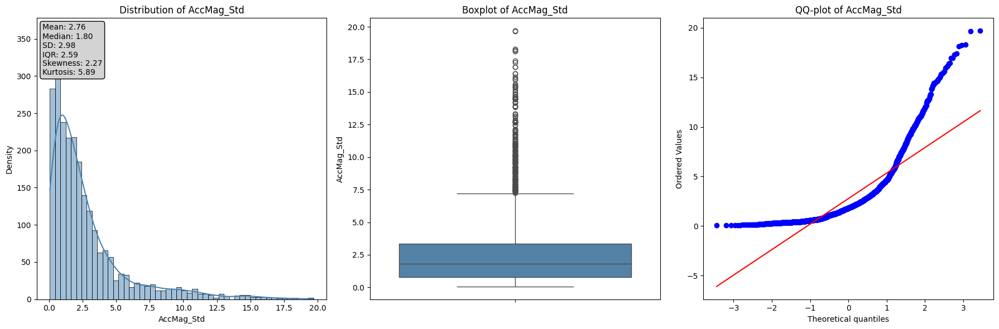

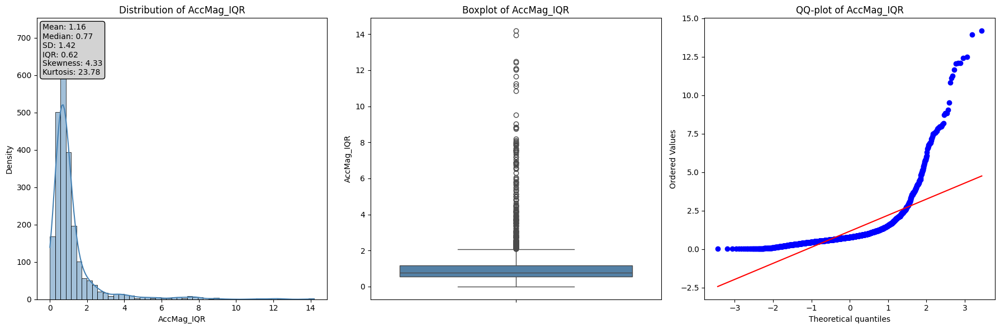

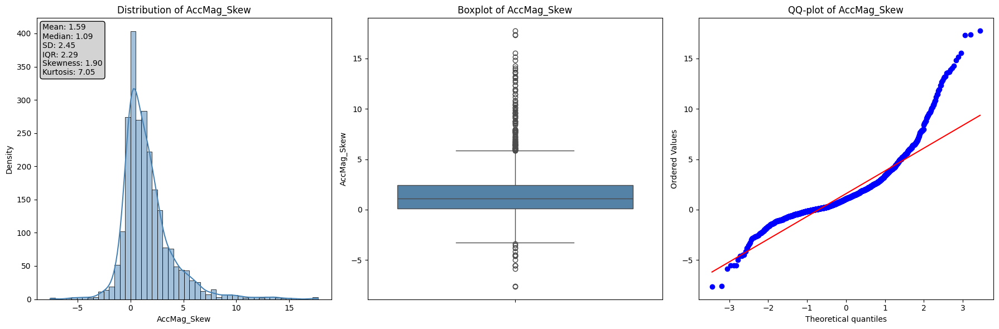

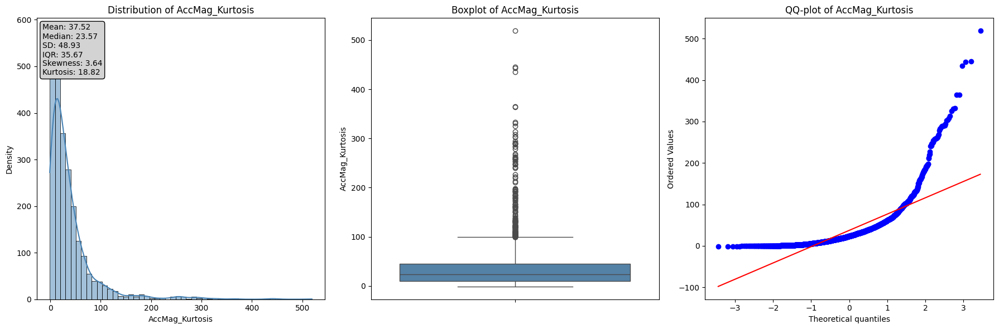

In [ ]:
plot_numerical_features(acc_features)

In [ ]:
shapiro_wilk_test(acc_features)

,Feature,W-Statistic,p-value,Normally Distributed
2,AccMag_IQR,0.539083,6.336922e-62,No
4,AccMag_Kurtosis,0.644875,3.354840e-57,No
1,AccMag_Std,0.744637,1.674762e-51,No
3,AccMag_Skew,0.849602,5.328579e-43,No
0,AccMag_Mean,0.906525,4.876845e-36,No


In [ ]:
test_label_subject_interaction(acc_features)

,feature,p_label,p_subject,p_interaction,significant_interaction
0,AccMag_Mean,4.930624e-27,0.000000e+00,4.417890e-238,True
1,AccMag_Std,9.836506e-101,1.949407e-66,3.242552e-73,True
2,AccMag_IQR,6.677244e-96,5.669346e-75,1.547834e-81,True
3,AccMag_Skew,9.217082e-11,3.125202e-22,1.614463e-32,True
4,AccMag_Kurtosis,8.354533e-01,1.520614e-18,2.228567e-37,True


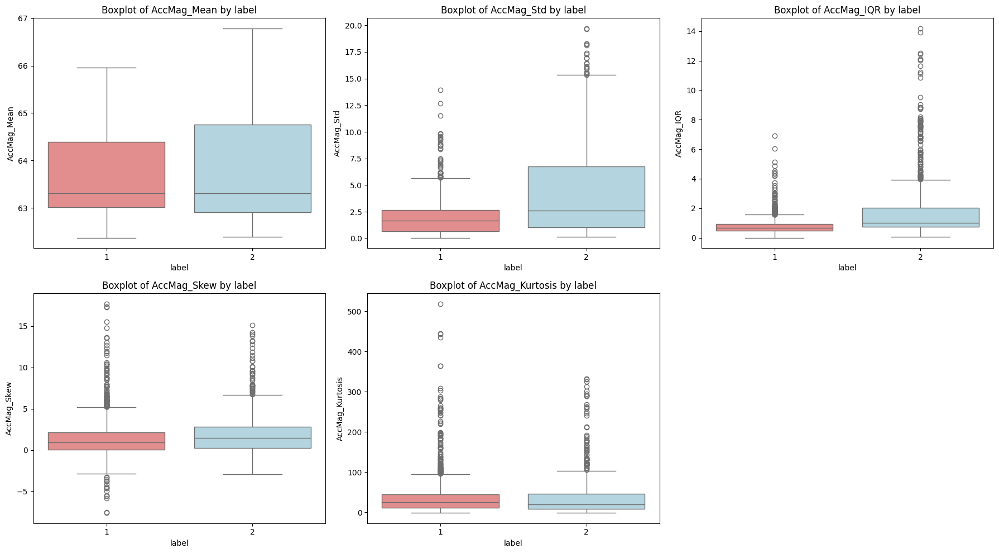

In [ ]:
plot_box_features(acc_features)

In [ ]:
mw_results, features_to_drop = mann_whitney_subjectwise(eda_features)

print("Feature da rimuovere:", features_to_drop)

Feature da rimuovere: []


In [ ]:
print("Final Shape of ACC Features:", acc_features.shape)
acc_features.head()

Final Shape of ACC Features: (2399, 7)


,AccMag_Mean,AccMag_Std,AccMag_IQR,AccMag_Skew,AccMag_Kurtosis,label,subject
0,63.734168,6.939395,2.941551,1.659809,16.127938,1,S2
1,63.839605,6.882462,4.176210,1.591902,16.330914,1,S2
2,63.730685,6.205541,2.092806,2.029033,24.598794,1,S2
3,63.251729,2.853339,1.226706,-0.017353,15.875609,1,S2
4,63.253129,2.680728,1.250813,-0.726639,17.682207,1,S2


In [ ]:
def temp_denoise(temp_signal, fs):
  b_low, a_low = butter_lowpass(0.5, fs)
  temp_signal = filtfilt(b_low, a_low, temp_signal)
  return temp_signal

In [ ]:
fs = 64
df['temp_clean'] = temp_denoise(df['temp'].values, fs)

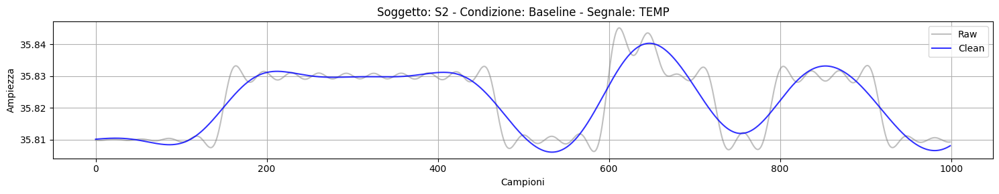

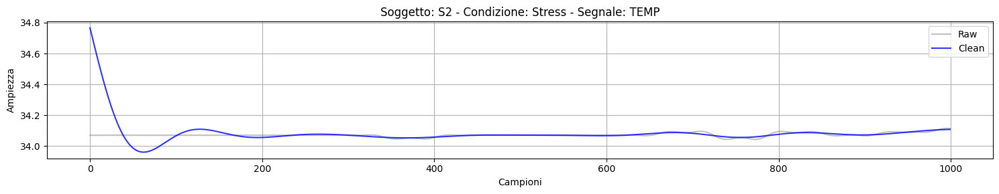

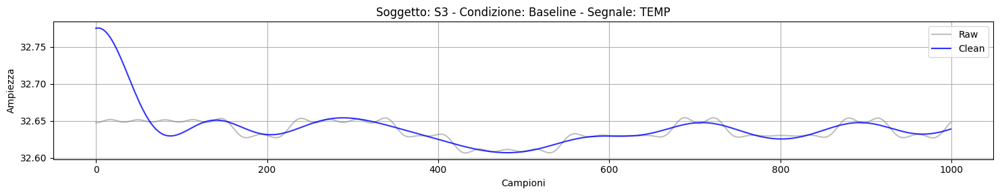

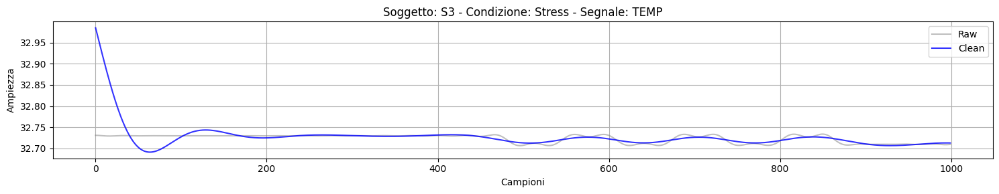

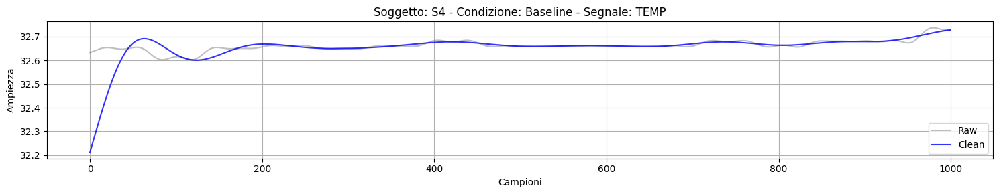

...

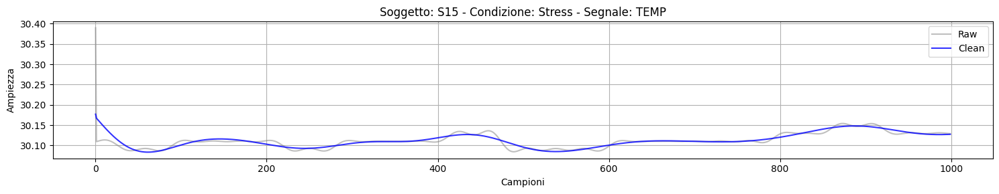

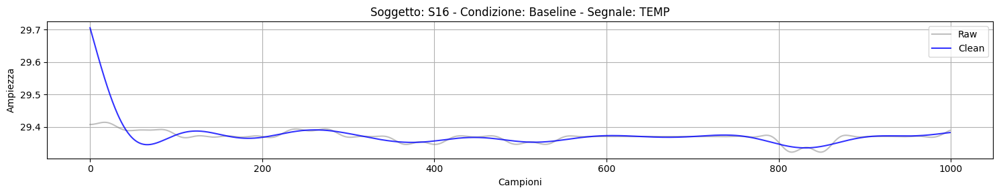

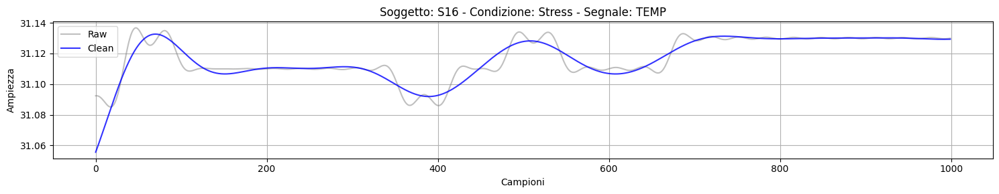

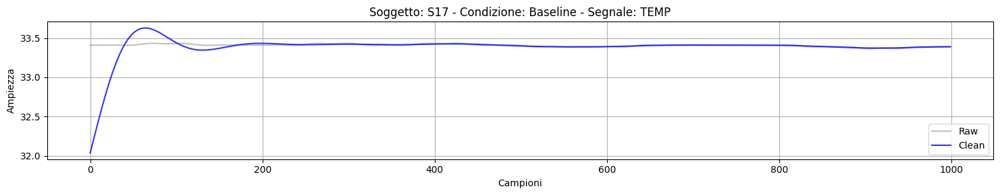

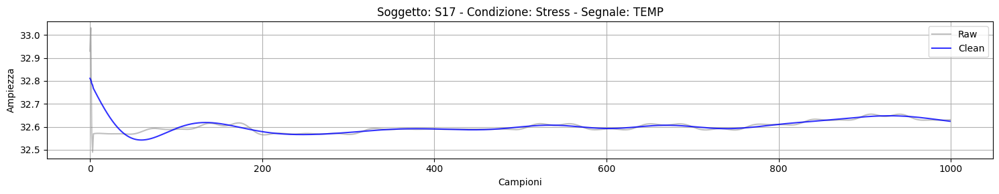

In [ ]:
plot_raw_vs_clean_from_single_df(df, 'temp', 'temp_clean', n_points = 1000)

In [ ]:
# Parametri
fs = 64  # frequenza di campionamento
window_sec = 45
overlap = 0.75
window_size = int(window_sec * fs)
step_size = int(window_size * (1 - overlap))

# Lista per raccogliere le feature
features_list = []

# Estrazione feature per ogni finestra
for start in range(0, len(df) - window_size + 1, step_size):
    end = start + window_size
    window_signal = df["temp_clean"].iloc[start:end].values
    window_label = df["label"].iloc[start]
    window_subject = df["subject"].iloc[start]

    try:
        mean_val = np.mean(window_signal)
        std_val = np.std(window_signal)
        min_val = np.min(window_signal)
        max_val = np.max(window_signal)
        slope = np.polyfit(np.arange(len(window_signal)), window_signal, 1)[0]

        features = {
            "Temp_Mean": mean_val,
            "Temp_Std": std_val,
            "Temp_Min": min_val,
            "Temp_Max": max_val,
            "Temp_Slope": slope,
            "label": window_label,
            "subject": window_subject
        }

        features_list.append(features)

    except Exception as e:
        print(f"Errore nella finestra {start}-{end}: {e}")
        continue

# Combina tutte le feature in un DataFrame
if features_list:
    temp_features = pd.DataFrame(features_list)
else:
    print("Nessuna finestra valida.")
    temp_features = pd.DataFrame()

In [ ]:
print("Shape of TEMP Features", temp_features.shape)
temp_features.head()

Shape of TEMP Features (2448, 7)


,Temp_Mean,Temp_Std,Temp_Min,Temp_Max,Temp_Slope,label,subject
0,35.815989,0.016132,35.771705,35.865665,-0.000006,1,S2
1,35.802184,0.025828,35.746292,35.865665,-0.000022,1,S2
2,35.782278,0.037271,35.708337,35.865665,-0.000040,1,S2
3,35.750905,0.046101,35.662688,35.865665,-0.000054,1,S2
4,35.725204,0.033188,35.662688,35.806703,-0.000033,1,S2


In [ ]:
temp_features.isna().sum()

,0
Temp_Mean,0
Temp_Std,0
Temp_Min,0
Temp_Max,0
Temp_Slope,0
label,0
subject,0


In [ ]:
temp_features, removed_cols = drop_highly_correlated_features(temp_features, exclude_cols=['label', 'subject'])

print("Colonne rimosse:", removed_cols)
print("Dimensione dataset:", temp_features.shape)

Colonne rimosse: ['Temp_Min', 'Temp_Max']
Dimensione dataset: (2448, 5)


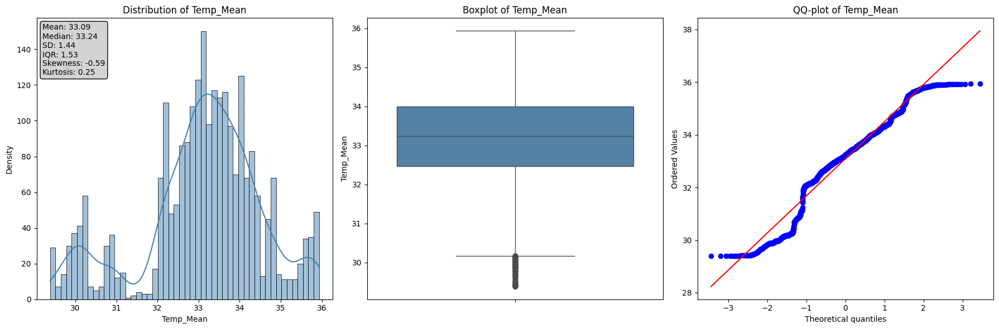

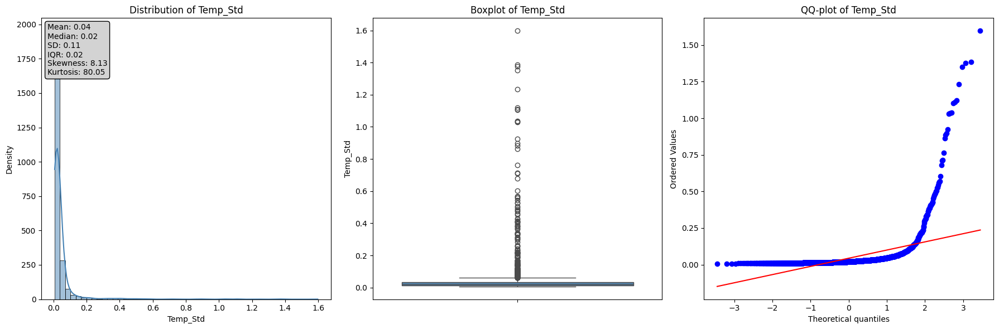

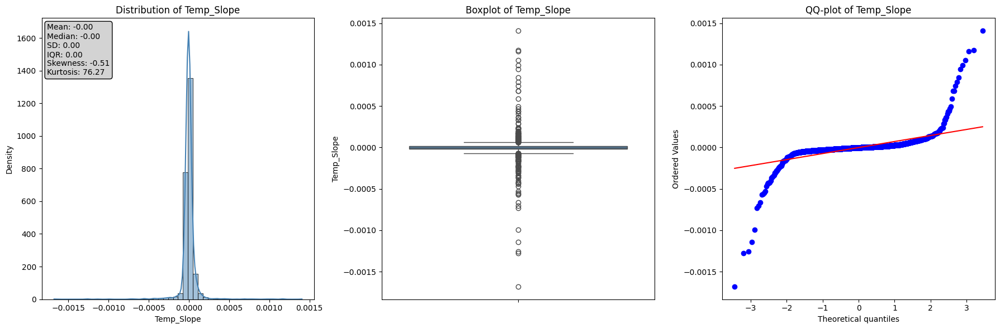

In [ ]:
plot_numerical_features(temp_features)

In [ ]:
shapiro_wilk_test(temp_features)

,Feature,W-Statistic,p-value,Normally Distributed
1,Temp_Std,0.267406,2.941520e-71,No
2,Temp_Slope,0.428686,2.110152e-66,No
0,Temp_Mean,0.951326,8.687947e-28,No


In [ ]:
test_label_subject_interaction(temp_features)

,feature,p_label,p_subject,p_interaction,significant_interaction
0,Temp_Mean,7.410985e-322,0.000000,0.000000,True
1,Temp_Std,1.885002e-06,0.000527,0.000043,True
2,Temp_Slope,3.950554e-02,0.000005,0.000003,True


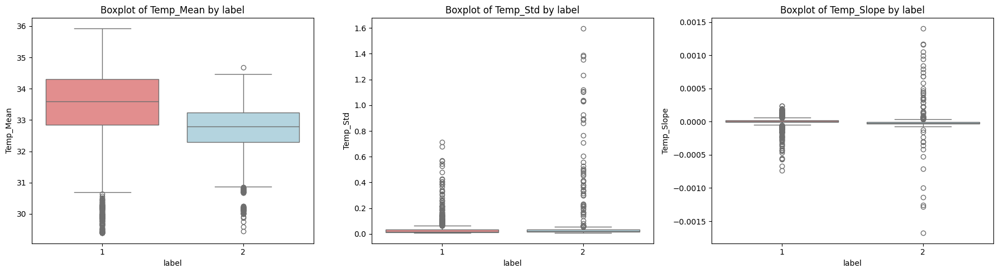

In [ ]:
plot_box_features(temp_features)

In [ ]:
mw_results, features_to_drop = mann_whitney_subjectwise(temp_features)

print("Feature da rimuovere:", features_to_drop)

Feature da rimuovere: []


In [ ]:
print("Final Shape of TEMP Features:", temp_features.shape)
temp_features.head()

Final Shape of TEMP Features: (2448, 5)


,Temp_Mean,Temp_Std,Temp_Slope,label,subject
0,35.815989,0.016132,-0.000006,1,S2
1,35.802184,0.025828,-0.000022,1,S2
2,35.782278,0.037271,-0.000040,1,S2
3,35.750905,0.046101,-0.000054,1,S2
4,35.725204,0.033188,-0.000033,1,S2


In [ ]:
print("Final Shape of BVP Features:", bvp_features.shape)
print("Final Shape of EDA Features:", eda_features.shape)
print("Final Shape of ACC Features:", acc_features.shape)
print("Final Shape of TEMP Features:", temp_features.shape)

Final Shape of BVP Features: (2448, 23)
Final Shape of EDA Features: (2448, 4)
Final Shape of ACC Features: (2399, 7)
Final Shape of TEMP Features: (2448, 5)


In [ ]:
# Trova la lunghezza minima
min_len = min(len(bvp_features), len(eda_features), len(acc_features), len(temp_features))

# Troncamento e reindicizzazione
bvp_trimmed = bvp_features.iloc[:min_len].reset_index(drop=True)
eda_trimmed = eda_features.iloc[:min_len].reset_index(drop=True)
acc_trimmed = acc_features.iloc[:min_len].reset_index(drop=True)
temp_trimmed = temp_features.iloc[:min_len].reset_index(drop=True)

# Verifica che le colonne label e subject siano allineate
# Se presenti in ogni dataframe, tienile solo da uno (es: da bvp_trimmed)
eda_trimmed = eda_trimmed.drop(columns=['label', 'subject'], errors='ignore')
acc_trimmed = acc_trimmed.drop(columns=['label', 'subject'], errors='ignore')
temp_trimmed = temp_trimmed.drop(columns=['label', 'subject'], errors='ignore')

# Concatenazione finale
all_features = pd.concat([bvp_trimmed, eda_trimmed, acc_trimmed, temp_trimmed], axis=1)

# Controllo dimensioni
print("Final shape of concatenated dataset:", all_features.shape)

Final shape of concatenated dataset: (2399, 33)


In [ ]:
all_features.head()

,HRV_MeanNN,HRV_SDNN,HRV_MedianNN,HRV_MadNN,HRV_SDRMSSD,HRV_Prc20NN,HRV_pNN50,HRV_MinNN,HRV_HTI,HRV_TINN,...,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,AccMag_Mean,AccMag_Std,AccMag_IQR,AccMag_Skew,AccMag_Kurtosis,Temp_Mean,Temp_Std,Temp_Slope
0,738.541667,253.074099,687.5000,196.907812,0.713761,575.000,83.333333,328.125,15.0,78.125,...,13.0,0.114257,63.734168,6.939395,2.941551,1.659809,16.127938,35.815989,0.016132,-0.000006
1,722.848361,235.343513,703.1250,231.656250,0.723276,500.000,90.163934,328.125,12.2,281.250,...,13.0,0.115145,63.839605,6.882462,4.176210,1.591902,16.330914,35.802184,0.025828,-0.000022
2,782.645089,354.409580,796.8750,277.987500,0.748387,500.000,83.928571,328.125,14.0,531.250,...,10.0,0.115030,63.730685,6.205541,2.092806,2.029033,24.598794,35.782278,0.037271,-0.000040
3,807.002315,233.974843,835.9375,150.576562,0.804962,603.125,66.666667,328.125,13.5,484.375,...,5.0,0.056022,63.251729,2.853339,1.226706,-0.017353,15.875609,35.750905,0.046101,-0.000054
4,794.034091,190.397436,812.5000,162.159375,0.801101,609.375,63.636364,437.500,11.0,62.500,...,6.0,0.043394,63.253129,2.680728,1.250813,-0.726639,17.682207,35.725204,0.033188,-0.000033


In [ ]:
all_features, removed_cols = drop_highly_correlated_features(all_features, exclude_cols=['label', 'subject'])

print("Colonne rimosse:", removed_cols)
print("Dimensione dataset:", all_features.shape)

Colonne rimosse: []
Dimensione dataset: (2399, 33)


In [ ]:
print("Features Subset:")
for col in all_features.columns:
  print(col)

Features Subset:
HRV_MeanNN
HRV_SDNN
HRV_MedianNN
HRV_MadNN
HRV_SDRMSSD
HRV_Prc20NN
HRV_pNN50
HRV_MinNN
HRV_HTI
HRV_TINN
HRV_MFDFA_alpha1_Max
HRV_MFDFA_alpha1_Fluctuation
HRV_SampEn
HRV_FuzzyEn
HRV_MSEn
HRV_CD
HRV_HFD
HRV_KFD
HRV_LZC
PPG_Amplitude
PPG_Duration
label
subject
SCR_Peaks_N
SCR_Peaks_Amplitude_Mean
AccMag_Mean
AccMag_Std
AccMag_IQR
AccMag_Skew
AccMag_Kurtosis
Temp_Mean
Temp_Std
Temp_Slope


In [ ]:
# Percorso per formato pickle
save_path_csv = "/content/drive/MyDrive/CROSS TEST/DATASET/WESAD_E4_45SEC_75OL.csv"

# Salvataggio
all_features.to_csv(save_path_csv, index = False)

print(f"Dataset salvato in formato CSV in: {save_path_csv}")

Dataset salvato in formato CSV in: /content/drive/MyDrive/CROSS TEST/DATASET/WESAD_E4_45SEC_75OL.csv
